

Contraints:
Data set is limited to the sensor readings from a single pump hence may not be the best representation of all the 
pumps. Computing power might become a constraint for effectively visualizing all 51 features at the same time.

Data:
The data set consists of 51 numerical features 
and a categorical label.The label contains string values that represent normal, broken and recovering 
operational conditions of the pump. The data set represents 219,521 readings from 51 sensors.   
Solution Approach:
I will solve this problem by developing a classification model that detects anomalies from the sensor readings and 
accordingly predicts the potential failure of the pump. To do that, I will first apply an appropriate unsupervised 
learning techniques to undertake dimensionality reduction for the effective visualization of the data and EDA. Then I 
will train classification models and will use cross-validation to evaluate their performance to select the best model.



# About the Dataset:


This Notebook will analyze the correlation between the input parameters (sensors) and determine which parameters are the most important, deciding on the output of the model, thereby building the simplest model, which requires less input parameters but the most accurate prediction results.

Anomaly Detection as Learning Normal Behavior
The underlying strategy for most approaches to anomaly detection is to first model normal behavior, and then exploit this knowledge to identify deviations (anomalies). Based on this model, an anomaly score is then assigned to each data point that represents a measure of deviation from normal behavior.

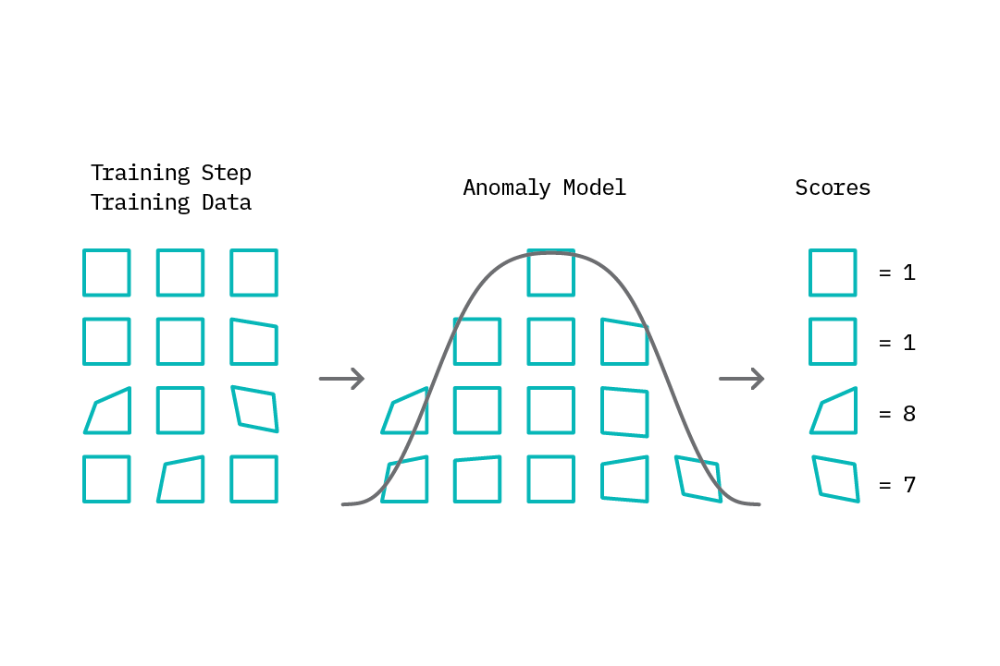

The training step in the anomaly detection loop: based on data (which may or may not contain abnormal samples), the anomaly detection model learns a model of normal behavior which it uses to assign anomaly scores.

The second step in the anomaly detection loop, the test step, introduces the concept of threshold-based anomaly tagging. Based on the range of scores assigned by the model, one can select a threshold rule that drives the anomaly tagging process; e.g., scores above a given threshold are tagged as anomalies, while those below it are tagged as normal. The idea of a threshold is valuable, as it provides the analyst an easy lever with which to tune the “sensitivity” of the anomaly tagging process. Interestingly, while most methods for anomaly detection follow this general approach, they differ in how they model normal behavior and generate anomaly scores.

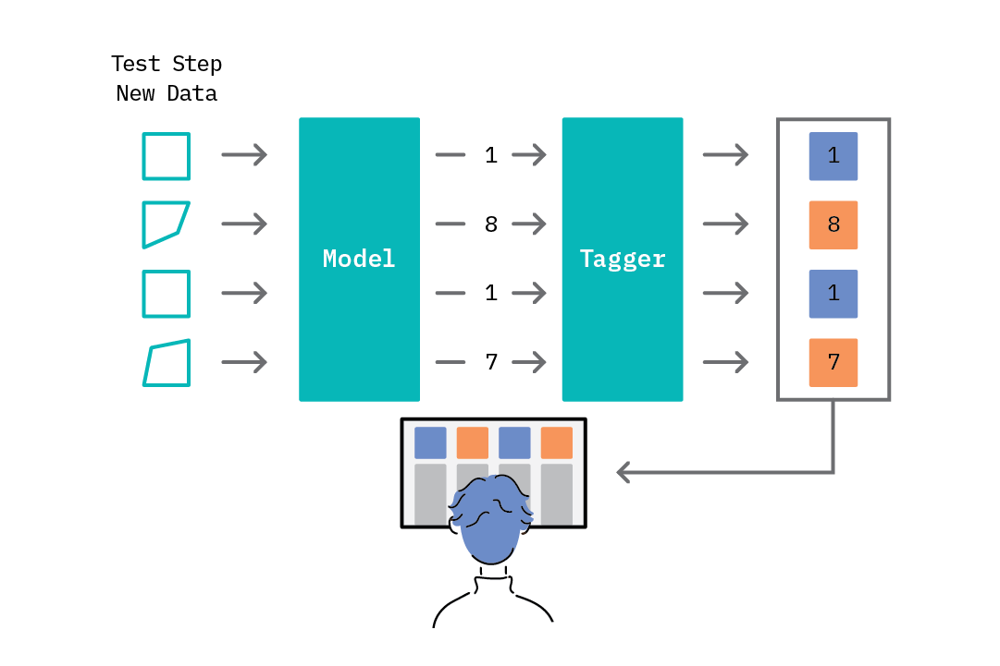

The test step in the anomaly detection loop.

To further illustrate this process, consider the scenario where the task is to detect abnormal temperatures (e.g., spikes), given data from the temperature sensors attached to servers in a data center. We can use a statistical approach to solve this problem (see the table in the following section for an overview of common methods). In step 1, we assume the samples follow a normal distribution, and we can use sample data to learn the parameters of this distribution (mean and variance). We assign an anomaly score based on a sample’s deviation from the mean and set a threshold (e.g., any value more than 3 standard deviations from the mean is an anomaly). In step 2, we then tag all new temperature readings and generate a report.

To further illustrate this process, consider the scenario where the task is to detect abnormal temperatures (e.g., spikes), given data from the temperature sensors attached to servers in a data center. We can use a statistical approach to solve this problem (see the table in the following section for an overview of common methods). In step 1, we assume the samples follow a normal distribution, and we can use sample data to learn the parameters of this distribution (mean and variance). We assign an anomaly score based on a sample’s deviation from the mean and set a threshold (e.g., any value more than 3 standard deviations from the mean is an anomaly). In step 2, we then tag all new temperature readings and generate a report.

Approaches to Modeling Normal Behavior

The majority of these approaches have been applied to univariate time series data; a single data point generated by the same process at various time steps (e.g., readings from a temperature sensor over time); and assume linear relationships within the data. Examples include k-means clustering, ARMA, ARIMA, etc.

Why Use Deep Learning for Anomaly Detection?
Deep learning approaches, when applied to anomaly detection, offer several advantages. First, these approaches are designed to work with multivariate and high dimensional data. This makes it easy to integrate information from multiple sources, and eliminates challenges associated with individually modeling anomalies for each variable and aggregating the results. Deep learning approaches are also well-adapted to jointly modeling the interactions between multiple variables with respect to a given task and - beyond the specification of generic hyperparameters (number of layers, units per layer, etc.) - deep learning models require minimal tuning to achieve good results.

Performance is another advantage. Deep learning methods offer the opportunity to model complex, nonlinear relationships within data, and leverage this for the anomaly detection task. The performance of deep learning models can also potentially scale with the availability of appropriate training data, making them suitable for data-rich problems.

# Project Workflow:


Machine failure prediction refers to the task of using machine learning and data analysis techniques to predict when a machine or equipment is likely to fail or experience a breakdown. By analyzing historical data and identifying patterns and indicators, machine failure prediction models can provide early warnings or alerts, enabling proactive maintenance and minimizing downtime.

Here is an overview of the process of machine failure predictions:

Data Collection: Relevant data is collected from the machines or equipment, such as sensor readings, operational parameters, maintenance records, and historical failure data. This data serves as the basis for training and building the predictive models.

Data Preprocessing: The collected data is cleaned, organized, and preprocessed to remove noise, handle missing values, and normalize the data. Feature engineering techniques may be applied to extract relevant features that capture patterns related to machine failures.

Feature Selection: Selecting the most informative features is crucial for building accurate prediction models. Various techniques, such as statistical analysis, correlation analysis, or domain knowledge, can be employed for feature selection.

Model Development: Machine learning algorithms, such as classification, regression, or time series analysis methods, are applied to train prediction models using the preprocessed data. The choice of algorithms depends on the nature of the data and the specific requirements of the prediction task.

Model Evaluation and Validation: The developed models are evaluated using suitable evaluation metrics to assess their performance and generalization capabilities. Cross-validation techniques may be employed to ensure robustness and reliability of the models.

Prediction and Maintenance Planning: Once the models are trained and validated, they can be used to predict machine failures in real-time. These predictions can help in scheduling preventive maintenance, optimizing resource allocation, and minimizing costly unplanned downtime.

By accurately predicting machine failures in advance, organizations can improve operational efficiency, reduce maintenance costs, enhance safety, and maximize the lifespan of their machines and equipment.

# Step1: Importing the necessary Libraries and Dataset.

In [128]:
## Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import warnings
warnings.filterwarnings('ignore')
sns.set(style = "whitegrid",font_scale = 1.5)
%matplotlib inline
plt.rcParams['figure.figsize']=[12,8]

In [129]:
#importing Dataset
sensor_df = pd.read_csv('sensor.csv')

# Step2: Data Wrangling

In [130]:

print("The dataset has " , sensor_df.shape[0],"rows and", sensor_df.shape[1], "columns")

The dataset has  220320 rows and 55 columns


In [131]:
#First 10 rows
sensor_df.head(10)

,Unnamed: 0,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,...,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,machine_status
0,0,2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
1,1,2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
2,2,2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,...,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037,NORMAL
3,3,2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,...,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250,NORMAL
4,4,2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,...,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889,NORMAL
5,5,2018-04-01 00:05:00,2.453588,47.09201,53.1684,46.397568,637.6157,78.18568,13.41146,16.16753,...,42.70833,38.773150,63.65741,51.79398,38.773150,164.6412,66.55093,241.6088,201.6782,NORMAL
6,6,2018-04-01 00:06:00,2.455556,47.04861,53.1684,46.397568,633.3333,75.81614,13.43316,16.13136,...,43.22916,38.194440,61.92130,51.79398,39.062500,171.8750,67.70834,240.1620,200.2315,NORMAL
7,7,2018-04-01 00:07:00,2.449653,47.13541,53.1684,46.397568,630.6713,75.77331,13.25231,16.12413,...,42.96875,38.194443,59.60648,50.92593,39.351850,178.5301,68.57639,241.3194,201.0995,NORMAL
8,8,2018-04-01 00:08:00,2.463426,47.09201,53.1684,46.397568,631.9444,74.58916,13.28848,16.13136,...,42.18750,38.194440,57.87037,50.63657,39.351850,182.0023,69.44444,243.0556,201.6782,NORMAL
9,9,2018-04-01 00:09:00,2.445718,47.17882,53.1684,46.397568,641.7823,74.57428,13.38252,16.24711,...,41.66666,39.062500,56.42361,50.63657,39.062500,186.6319,69.73380,246.5278,200.8102,NORMAL


In [132]:
# Last 10 rows
sensor_df.tail(10)

,Unnamed: 0,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,...,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,machine_status
220310,220310,2018-08-31 23:50:00,2.404398,47.61285,50.520830,43.142361,629.976800,65.20339,15.15480,16.65220,...,37.50000,73.49537,48.90046,46.00694,40.509260,236.4005,131.9444,NaN,208.6227,NORMAL
220311,220311,2018-08-31 23:51:00,2.402431,47.69965,50.520832,43.142361,637.963000,64.44035,15.08970,16.60880,...,37.76041,77.83565,53.24074,46.29630,40.798610,228.2986,137.7315,NaN,214.4097,NORMAL
220312,220312,2018-08-31 23:52:00,2.404398,47.61285,50.520832,43.142361,637.036987,65.54104,15.11863,16.61603,...,37.76041,78.12500,55.55556,47.45370,40.798611,220.4861,146.1227,NaN,220.4861,NORMAL
220313,220313,2018-08-31 23:53:00,2.406366,47.69965,50.520830,43.142361,629.976807,63.78558,15.04630,16.65220,...,38.02083,74.07407,55.26620,48.03241,40.798610,215.2778,148.7269,NaN,224.2477,NORMAL
220314,220314,2018-08-31 23:54:00,2.396528,47.61285,50.564240,43.142361,637.962952,62.86275,15.13310,16.60880,...,38.28125,70.02315,54.68750,48.32176,41.087960,213.2523,150.4630,NaN,227.7199,NORMAL
220315,220315,2018-08-31 23:55:00,2.407350,47.69965,50.520830,43.142361,634.722229,64.59095,15.11863,16.65220,...,38.28125,68.28703,52.37268,48.32176,41.087960,212.3843,153.6458,NaN,231.1921,NORMAL
220316,220316,2018-08-31 23:56:00,2.400463,47.69965,50.564240,43.142361,630.902771,65.83363,15.15480,16.70284,...,38.28125,66.84028,50.63657,48.03241,40.798610,213.8310,156.2500,NaN,231.1921,NORMAL
220317,220317,2018-08-31 23:57:00,2.396528,47.69965,50.520830,43.142361,625.925903,67.29445,15.08970,16.70284,...,39.06250,65.39352,48.90046,48.03241,40.798610,217.3032,155.3819,NaN,232.0602,NORMAL
220318,220318,2018-08-31 23:58:00,2.406366,47.69965,50.520832,43.142361,635.648100,65.09175,15.11863,16.56539,...,40.62500,64.23611,47.74306,48.32176,40.509258,222.5116,153.9352,NaN,234.0856,NORMAL
220319,220319,2018-08-31 23:59:00,2.396528,47.69965,50.520832,43.142361,639.814800,65.45634,15.11863,16.65220,...,41.40625,62.78935,46.29630,48.90046,40.219910,227.4306,150.4630,NaN,234.0856,NORMAL


The data set has 55 columns in total inclusing 52 sensors,timestamp,machine status and Unnamed column. We  have data for sensor readings from April to August, collected daily every minute.

In [133]:
sensor_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 220320 entries, 0 to 220319
Data columns (total 55 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      220320 non-null  int64  
 1   timestamp       220320 non-null  object 
 2   sensor_00       210112 non-null  float64
 3   sensor_01       219951 non-null  float64
 4   sensor_02       220301 non-null  float64
 5   sensor_03       220301 non-null  float64
 6   sensor_04       220301 non-null  float64
 7   sensor_05       220301 non-null  float64
 8   sensor_06       215522 non-null  float64
 9   sensor_07       214869 non-null  float64
 10  sensor_08       215213 non-null  float64
 11  sensor_09       215725 non-null  float64
 12  sensor_10       220301 non-null  float64
 13  sensor_11       220301 non-null  float64
 14  sensor_12       220301 non-null  float64
 15  sensor_13       220301 non-null  float64
 16  sensor_14       220299 non-null  float64
 17  sensor_15 

The data set consists of 51 numerical features 
and a categorical label.The label contains string values that represent normal, broken and recovering 
operational conditions of the machine. 

In [134]:
#statistical analysis of the dataset
sensor_df.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,220320.0,110159.500000,63601.049991,0.000000,55079.750000,110159.500000,165239.250000,220319.000000
sensor_00,210112.0,2.372221,0.412227,0.000000,2.438831,2.456539,2.499826,2.549016
sensor_01,219951.0,47.591611,3.296666,0.000000,46.310760,48.133678,49.479160,56.727430
sensor_02,220301.0,50.867392,3.666820,33.159720,50.390620,51.649300,52.777770,56.032990
sensor_03,220301.0,43.752481,2.418887,31.640620,42.838539,44.227428,45.312500,48.220490
sensor_04,220301.0,590.673936,144.023912,2.798032,626.620400,632.638916,637.615723,800.000000
sensor_05,220301.0,73.396414,17.298247,0.000000,69.976260,75.576790,80.912150,99.999880
sensor_06,215522.0,13.501537,2.163736,0.014468,13.346350,13.642940,14.539930,22.251160
sensor_07,214869.0,15.843152,2.201155,0.000000,15.907120,16.167530,16.427950,23.596640
sensor_08,215213.0,15.200721,2.037390,0.028935,15.183740,15.494790,15.697340,24.348960


In [135]:
print('all class labels:',sensor_df['machine_status'].unique())

all class labels: ['NORMAL' 'BROKEN' 'RECOVERING']


The label data has 3 machine status values. BROKEN represents machine is failed. RECOVERING represents machine trying to recover from failed status. NORMAL represents the machine is working in normal status.

In [136]:
#Machine status distribution

sensor_df['machine_status'].value_counts()


NORMAL        205836
RECOVERING     14477
BROKEN             7
Name: machine_status, dtype: int64

# Step 3:   Data Preprocessing

We can already see that the data requires some cleaning, there are missing values, an empty column and a timestamp with an incorrect data type. So I will apply the following steps to tidy up the data set.

Remove redundant columns

Remove duplicates

Handle missing values

Convert Timestamp column which is of type object to datetime

In [137]:
#no values for sensor 15 and unnamed column is unnecessary,so I will drop these columns
sensor_df.drop(['sensor_15','Unnamed: 0'],inplace = True,axis=1)
sensor_df.head()

,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_50,sensor_51,machine_status
0,2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
1,2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,243.0556,201.3889,NORMAL
2,2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,...,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,241.3194,203.7037,NORMAL
3,2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,...,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,240.4514,203.1250,NORMAL
4,2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,...,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,242.1875,201.3889,NORMAL


Next, let’s handle the missing values and for that let’s first see the columns that have missing values and see what percentage of the data is missing. 

In [138]:
#check percentage of missing values for each column
(sensor_df.isnull().sum().sort_values(ascending=False)/len(sensor_df))*100

sensor_50         34.956881
sensor_51          6.982117
sensor_00          4.633261
sensor_07          2.474129
sensor_08          2.317992
sensor_06          2.177741
sensor_09          2.085603
sensor_01          0.167484
sensor_30          0.118464
sensor_29          0.032680
sensor_32          0.030864
sensor_17          0.020879
sensor_18          0.020879
sensor_22          0.018609
sensor_25          0.016340
sensor_16          0.014070
sensor_49          0.012255
sensor_48          0.012255
sensor_47          0.012255
sensor_46          0.012255
sensor_45          0.012255
sensor_44          0.012255
sensor_43          0.012255
sensor_42          0.012255
sensor_41          0.012255
sensor_40          0.012255
sensor_39          0.012255
sensor_38          0.012255
sensor_14          0.009532
sensor_26          0.009078
sensor_03          0.008624
sensor_10          0.008624
sensor_13          0.008624
sensor_12          0.008624
sensor_11          0.008624
sensor_05          0

To clean-up the data, the following steps were applied.

1. Remove redundant columns(sensor 15,Unnamed:0)
2. Replace missing values by their mean
3. Convert the type of timestamp to pandas datetime and set it as index
4. Checking for Duplicates

In [139]:
#too many missing values in sensor 50 , so dropping that
sensor_df.drop('sensor_50',inplace = True,axis=1)
sensor_df.head()

,timestamp,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,...,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_51,machine_status
0,2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889,NORMAL
1,2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889,NORMAL
2,2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,...,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,203.7037,NORMAL
3,2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,...,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,203.1250,NORMAL
4,2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,...,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,201.3889,NORMAL


I decided to impute some of the missing values with their mean 

In [140]:
#imputing the remaining missing values with mean
sensor_df.fillna(sensor_df.mean(),inplace= True)
sensor_df.isnull().sum()

timestamp         0
sensor_00         0
sensor_01         0
sensor_02         0
sensor_03         0
sensor_04         0
sensor_05         0
sensor_06         0
sensor_07         0
sensor_08         0
sensor_09         0
sensor_10         0
sensor_11         0
sensor_12         0
sensor_13         0
sensor_14         0
sensor_16         0
sensor_17         0
sensor_18         0
sensor_19         0
sensor_20         0
sensor_21         0
sensor_22         0
sensor_23         0
sensor_24         0
sensor_25         0
sensor_26         0
sensor_27         0
sensor_28         0
sensor_29         0
sensor_30         0
sensor_31         0
sensor_32         0
sensor_33         0
sensor_34         0
sensor_35         0
sensor_36         0
sensor_37         0
sensor_38         0
sensor_39         0
sensor_40         0
sensor_41         0
sensor_42         0
sensor_43         0
sensor_44         0
sensor_45         0
sensor_46         0
sensor_47         0
sensor_48         0
sensor_49         0


In [141]:
 #checking of duplicate rows
    
sensor_df.duplicated().any()

False

No duplicate values, hence we don't need to remove any row.

In [142]:
# Now, lets make it a time series and set it as index
sensor_df['timestamp'] = pd.to_datetime(sensor_df['timestamp'])
sensor_df = sensor_df.set_index('timestamp') 

After the data wrangling process,my final dataset includes 52 sensors/features,datetime and machine status column that contains 3 classes that represent the NORMAL,BROKEN AND RECOVERING operating conditions of the pump.
The First 5 rows of the dataset looks as follows.

In [143]:
sensor_df.head()

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_51,machine_status
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889,NORMAL
2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889,NORMAL
2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,...,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,203.7037,NORMAL
2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,...,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,203.1250,NORMAL
2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,...,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,201.3889,NORMAL


# Step 4: Exploratory Data Analysis(EDA)

Now that I have cleaned the data, I can start exploring to acquaint with the data set.On top of some quantitative EDA, I performed additional graphical EDA to look for trends and any odd behaviors

In [144]:
## Machine status distribution
sensor_df.machine_status.value_counts()

NORMAL        205836
RECOVERING     14477
BROKEN             7
Name: machine_status, dtype: int64

<AxesSubplot:title={'center':'machine_status'}, xlabel='machine_status', ylabel='count'>

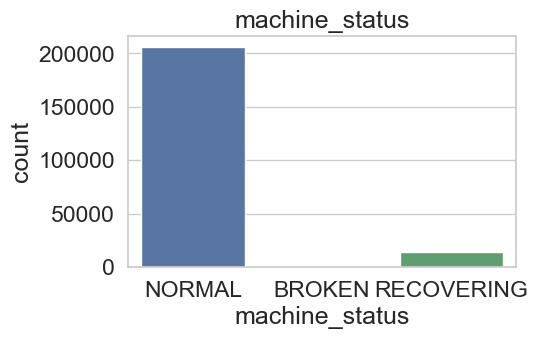

In [145]:
#Plotting Machine Status Distribution
plt.figure(figsize=(5,3))
plt.title('machine_status')
sns.countplot(x='machine_status',data=sensor_df)


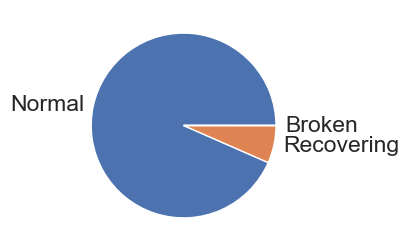

In [146]:
#machine status -  pie chart
plt.figure(figsize=(5,3))
stroke_labels = ["Normal","Recovering","Broken"]
sizes = sensor_df.machine_status.value_counts()

plt.pie(x=sizes,labels=stroke_labels)
plt.show()

As we can see, majority of the time the sensors register NORMAL. This makes sense because the machine should be working normally most of the time. We then see the RECOVERING as the next group, which also makes sense given that the machine breaks then take a bit to recover. Lastly, only 0.004% of the data is in BROKEN status. This is okay because a machine breaks, and in theory, shouldn't be broken for very long.

#Heatmap for Correlation

Correlation Anlaysis analysis the correlation between the input parameters (sensors) and determine which parameters are the most important, deciding on the output of the model.

A value of 1 means Positive Correlation
A value of 0 means No Correlation
A value of -1 means Negative Correlation



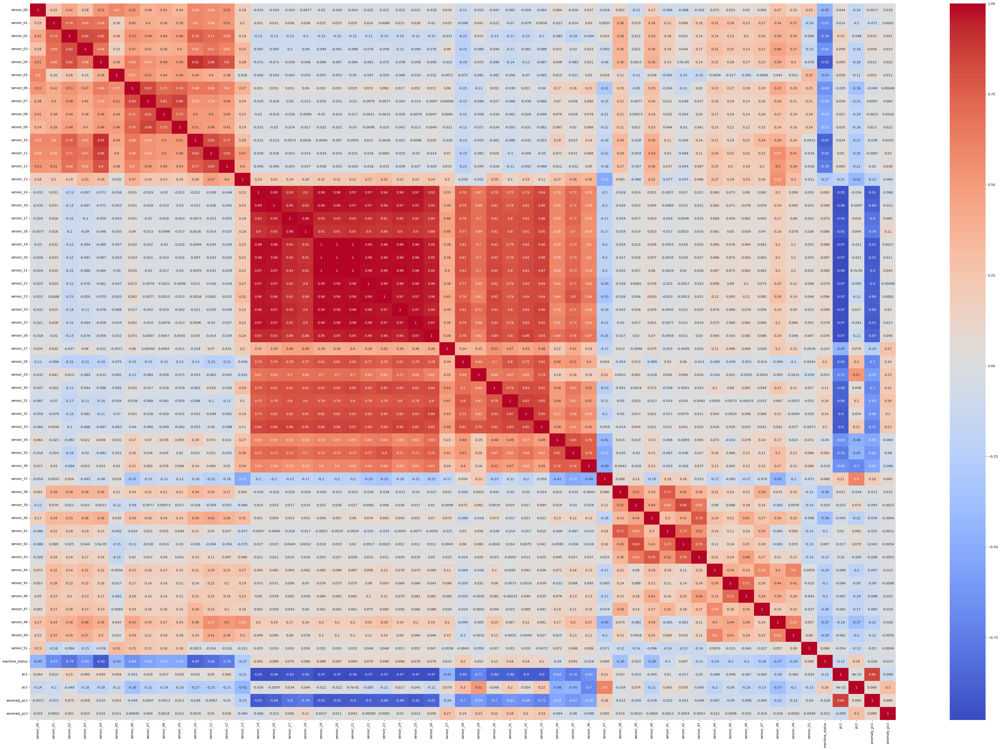

In [283]:
plt.figure(figsize=(60,40))
sns.heatmap(sensor_df.corr(),annot=True,cmap='coolwarm');
corr = sensor_df.corr()

<AxesSubplot:>

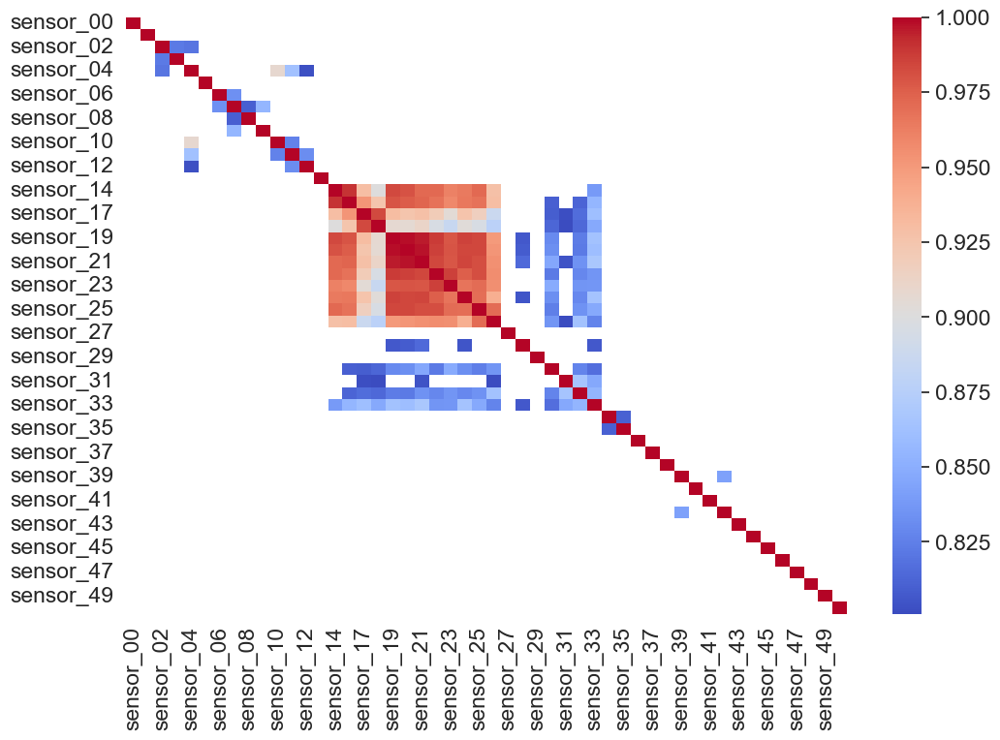

In [149]:
#The HeatMap shows Correlation between features greater than 0.8
corr80 = corr[abs(corr)> 0.8]
sns.heatmap(corr80,cmap='coolwarm')

From the heatmap ,we see that sensor  14 to 29 have a high correlation  with the target variable, hence will be important in predicting machine failure.

In [151]:
#sns.pairplot(sensor_df,hue='machine_status')

#plt.show()

The plots below show the sensor readings plotted over time with the machine status of “BROKEN” marked up on the same graph in red color. That way, we can clearly see when the machine breaks down and how that reflects in the sensor readings. The following code plots the mentioned graph for each of the sensors.

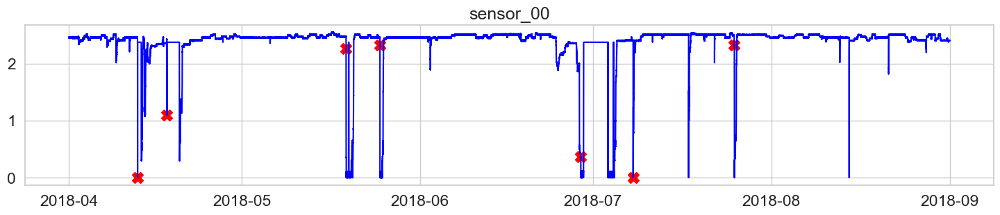

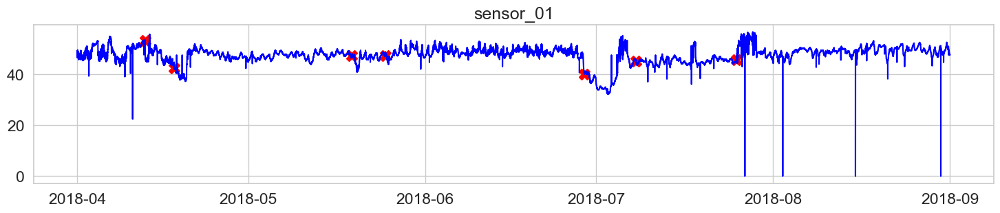

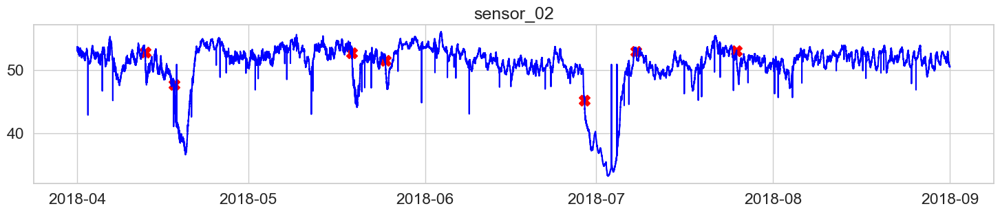

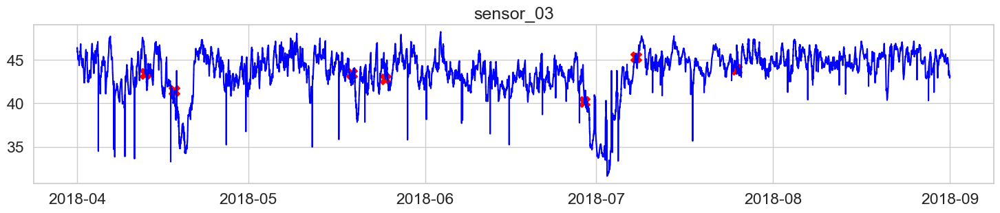

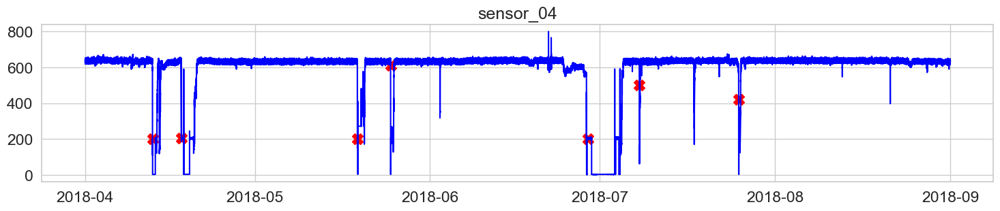

...

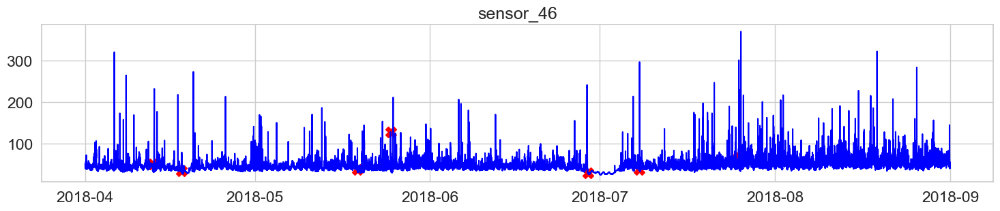

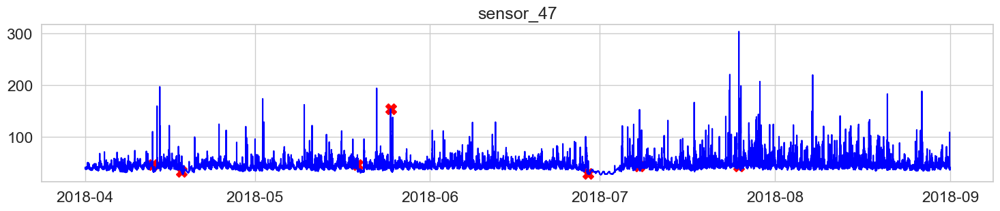

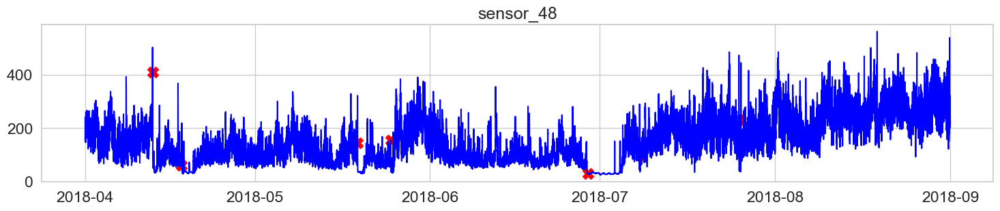

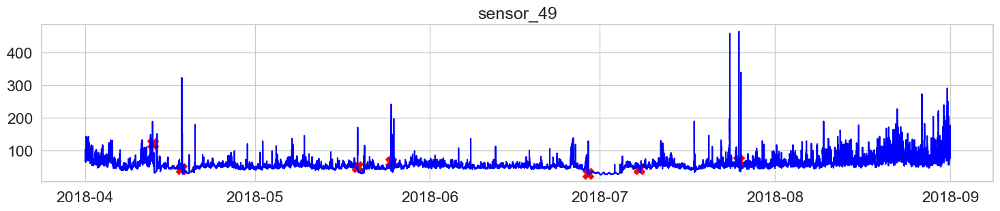

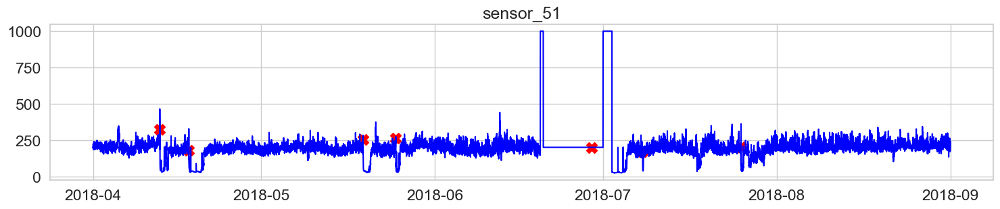

In [152]:
#extract the readings from the Broken state of the pump
broken= sensor_df[sensor_df['machine_status']=='BROKEN']

#Extract the name of the numerical columns
sensor_df_2 = sensor_df.drop(['machine_status'],axis=1)
names= sensor_df_2.columns

#plot timeseries for each sensor with Broken state marked with X in red color

for name in names:
    _=plt.figure(figsize=(18,3))
    _=plt.plot(broken[name],linestyle='none',marker='X',color='red',markersize=12)
    _=plt.plot(sensor_df[name],color='blue')
    _=plt.title(name)
    plt.show()

As seen clearly from the above plots, the red marks, which represent the broken state of the machine(huge spikes), perfectly overlaps with the observed disturbances of the sensor reading. Now we have a pretty good intuition about how each of the sensor reading behaves when the machine is broken vs operating normally.

This could be an indictator for predicting failure.

In [153]:
#Converting the machine status column to numeric
MS_class_dict = {"BROKEN": 0, "NORMAL": 1, "RECOVERING": 2}
sensor_df['machine_status'] = sensor_df['machine_status'].map(MS_class_dict)
sensor_df.head()

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_42,sensor_43,sensor_44,sensor_45,sensor_46,sensor_47,sensor_48,sensor_49,sensor_51,machine_status
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889,1
2018-04-01 00:01:00,2.465394,47.09201,53.2118,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,31.770832,41.92708,39.641200,65.68287,50.92593,38.194440,157.9861,67.70834,201.3889,1
2018-04-01 00:02:00,2.444734,47.35243,53.2118,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,...,31.770830,41.66666,39.351852,65.39352,51.21528,38.194443,155.9606,67.12963,203.7037,1
2018-04-01 00:03:00,2.460474,47.09201,53.1684,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,...,31.510420,40.88541,39.062500,64.81481,51.21528,38.194440,155.9606,66.84028,203.1250,1
2018-04-01 00:04:00,2.445718,47.13541,53.2118,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,...,31.510420,41.40625,38.773150,65.10416,51.79398,38.773150,158.2755,66.55093,201.3889,1


# Step 5: Stationarity and Autocorrelation

In time series analysis, it is important that the data is stationary and have no autocorrelation. 



Autocorrelation refers to the behavior of the data where the data is correlated with itself in a different time period.

Rolling mean or avergae is a calculation to analyze data points by creating a series of averages of different subsets of the full data set. It is also called a moving mean.


As the next step, I will visually inspect the stationarity of each feature in the data set and to do that,I resampled the data by daily average.

Later, I will also perform the Dickey Fuller test to quantitatively verify the observed stationarity. 

In addition, I will inspect the autocorrelation of the features before feeding them into the clustering algorithms to detect anomalies.

In [154]:
# Resample the entire dataset by daily average
rollmean = sensor_df.resample(rule='D').mean()
rollstd = sensor_df.resample(rule='D').std()

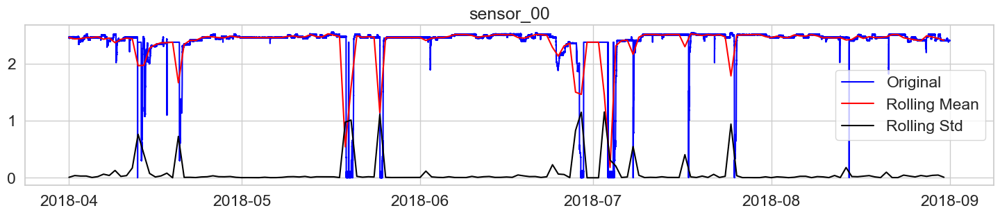

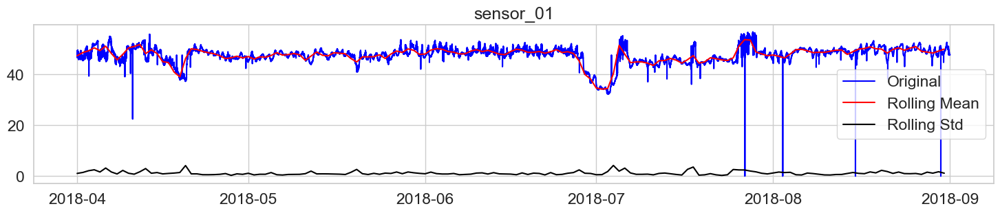

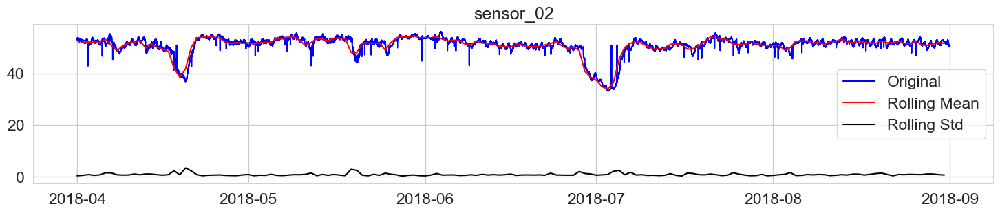

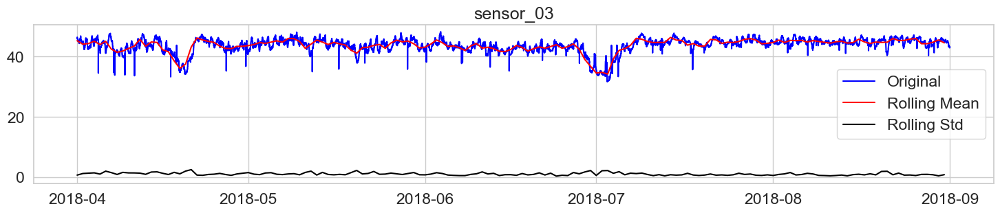

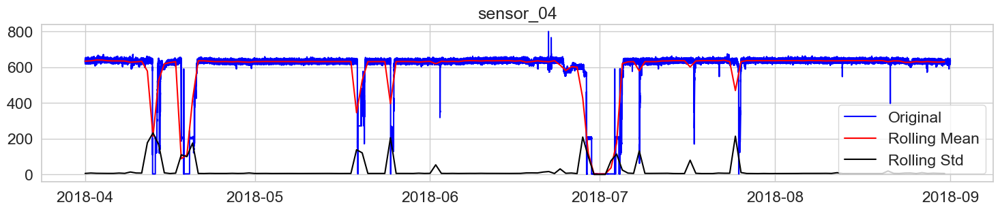

...

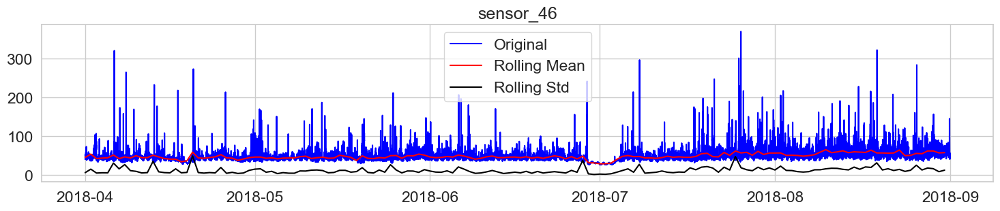

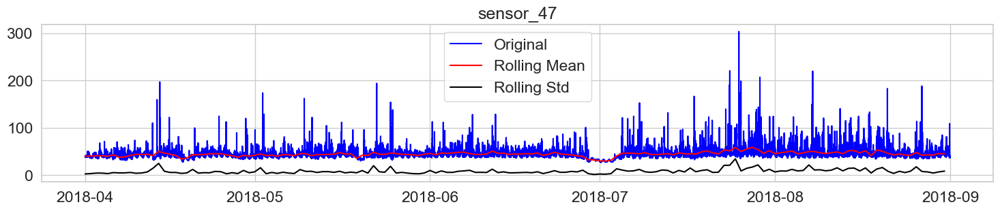

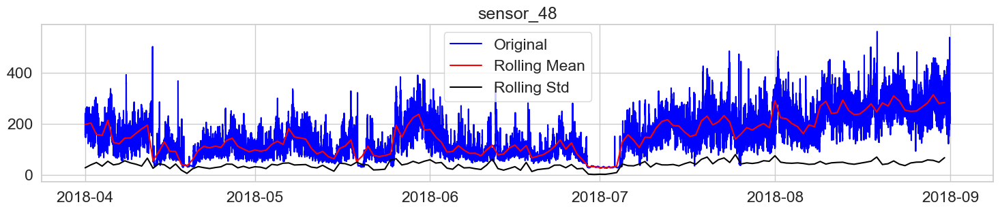

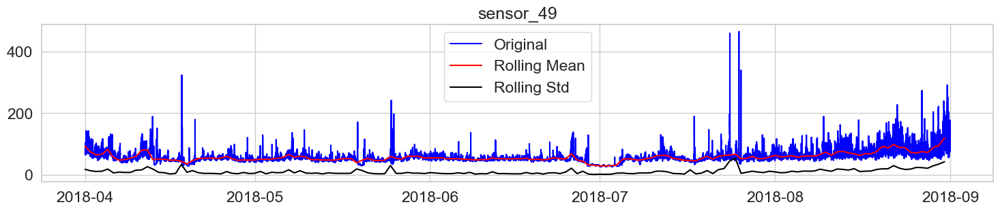

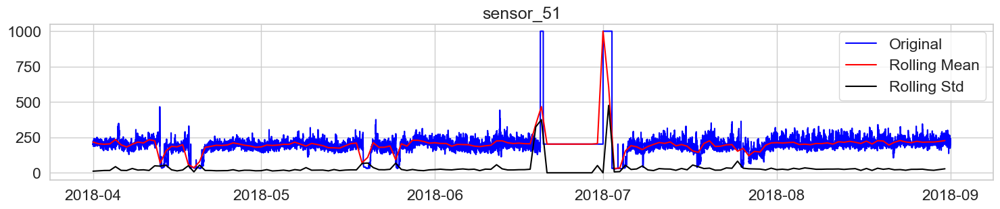

In [155]:
# Plot time series for each sensor with its mean and standard deviation with the BROKEN state marked with X in red color
for name in names:
    _ = plt.figure(figsize=(18,3))
    _ = plt.plot(sensor_df[name], color='blue', label='Original')
    _ = plt.plot(rollmean[name], color='red', label='Rolling Mean')
    _ = plt.plot(rollstd[name], color='black', label='Rolling Std' )
    _ = plt.legend(loc='best')
    _ = plt.title(name)
    plt.show()

Looking at the above ,plots, the data actually looks pretty stationary where the rolling mean and standard deviation don’t seem to change over time except during the downtime of the pump which is expected. This was the case for most of the sensors in this data set but it may not always be the case in which situations various transformation methods must be applied to make the data stationary before training the data.



# Step 6: Pre-processing and Feature Engineering

It is pretty computationally expensive to train models with all of the 52 sensors/features and it is not efficient. Therefore, I will employ Principal Component Analysis (PCA) technique to extract new features to be used for the modeling. In order to properly apply PCA, the data must be scaled and standardized. This is because PCA and most of the learning algorithms are distance based algorithms. If noticed from the first 10 rows of the tidy data, the magnitude of the values from each feature is not consistent. Some are very small while some others are really large values. I will perform the following steps using the Pipeline library.

1.Scale the data

2.Perform PCA and look at the most important principal components based on inertia

In [156]:
# Standardize/scale the dataset and apply PCA
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import make_pipeline

# Extract the names of the numerical columns
df2 = sensor_df.drop(['machine_status'], axis=1)
names=df2.columns
x = sensor_df[names]
scaler = StandardScaler()
pca = PCA()
pipeline = make_pipeline(scaler, pca)
pipeline.fit(x)


Pipeline(steps=[('standardscaler', StandardScaler()), ('pca', PCA())])

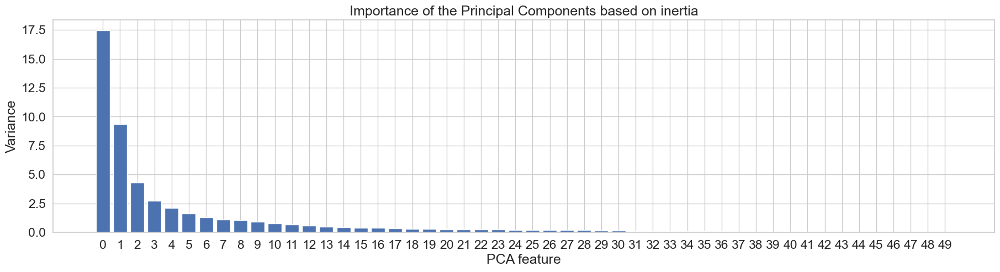

In [157]:
features = range(pca.n_components_)
_ = plt.figure(figsize=(22, 5))
_ = plt.bar(features, pca.explained_variance_)
_ = plt.xlabel('PCA feature')
_ = plt.ylabel('Variance')
_ = plt.xticks(features)
_ = plt.title("Importance of the Principal Components based on inertia")
plt.show()

It appears that the first two principal components are the most important as per the features extracted by the PCA in above importance plot. So as the next step, I will perform PCA with 2 components which will be my features to be used in the training of the models.

In [168]:
# Calculate PCA with 2 components
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents, columns = ['pc1', 'pc2'])
principalDf.head()

,pc1,pc2
0,69.523134,265.704571
1,69.523134,265.704571
2,27.841569,283.462197
3,24.548981,290.213914
4,29.627090,294.619639


In [159]:
sensor_df['pc1']=pd.Series(principalDf['pc1'].values, index=sensor_df.index)
sensor_df['pc2']=pd.Series(principalDf['pc2'].values, index=sensor_df.index)

In [161]:
sensor_df['pc1'],sensor_df['pc2']

(timestamp
 2018-04-01 00:00:00     69.523134
 2018-04-01 00:01:00     69.523134
 2018-04-01 00:02:00     27.841569
 2018-04-01 00:03:00     24.548981
 2018-04-01 00:04:00     29.627090
                           ...    
 2018-08-31 23:55:00   -308.531521
 2018-08-31 23:56:00   -294.603672
 2018-08-31 23:57:00   -300.207654
 2018-08-31 23:58:00   -285.141390
 2018-08-31 23:59:00   -298.182526
 Name: pc1, Length: 220320, dtype: float64,
 timestamp
 2018-04-01 00:00:00    265.704571
 2018-04-01 00:01:00    265.704571
 2018-04-01 00:02:00    283.462197
 2018-04-01 00:03:00    290.213914
 2018-04-01 00:04:00    294.619639
                           ...    
 2018-08-31 23:55:00   -274.597310
 2018-08-31 23:56:00   -256.328332
 2018-08-31 23:57:00   -256.932727
 2018-08-31 23:58:00   -263.099471
 2018-08-31 23:59:00   -264.545953
 Name: pc2, Length: 220320, dtype: float64)

#### Check stationarity with Dickey-Fuller Test

A time series has stationarity if a shift in time doesn’t cause a change in the shape of the distribution. Basic properties of the distribution like the mean , variance and covariance are constant over time. Stationarity can be defined in precise mathematical terms, but for our purpose we mean a flat looking series, without trend, constant variance over time, a constant autocorrelation structure over time and no periodic fluctuations (seasonality).


ADF (Augmented Dickey Fuller) Test The Dickey Fuller test is one of the most popular statistical tests. It can be used to determine the presence of unit root in the series, and hence help us understand if the series is stationary or not. The null and alternate hypothesis of this test are:

Null Hypothesis: The series has a unit root (value of a =1)

Alternate Hypothesis: The series has no unit root.

If we fail to reject the null hypothesis, we can say that the series is non-stationary. This means that the series can be linear or difference stationary (we will understand more about difference stationary in the next section).



Now, I will check again the stationarity and autocorrelation of these two principal components just to be sure they are stationary and not autocorrelated

In [162]:
from statsmodels.tsa.stattools import adfuller
# Run Augmented Dickey Fuller Test
result = adfuller(principalDf['pc1'])
# Print p-value
print(result[1])

2.4629444369550607e-05


In [163]:
# Run Augmented Dickey Fuller Test
result = adfuller(principalDf['pc2'])
# Print p-value
print(result[1])

1.7777868170049453e-06


Running the Dickey Fuller test on the 1st principal component, I got a p-value of 2.4629444369550607e-05 which is very small number (much smaller than 0.05). Thus, I will reject the Null Hypothesis and say the data is stationary. I performed the same on the 2nd component and got a similar result. So both of the principal components are stationary which is what I wanted.

#### Check for Autocorrelation

Now, let’s check for autocorrelation in both of these principal components. It can be done one of the two ways; either with the pandas autocorr() method or ACF plot. I will use the latter in this case to quickly visually verify that there is no autocorrelation. The following code does just that.

In [164]:
# Compute change in daily mean 
pca1 = principalDf['pc1'].pct_change()
# Compute autocorrelation
autocorrelation = pca1.dropna().autocorr()
print('Autocorrelation is: ', autocorrelation)

Autocorrelation is:  -6.773604518564041e-06


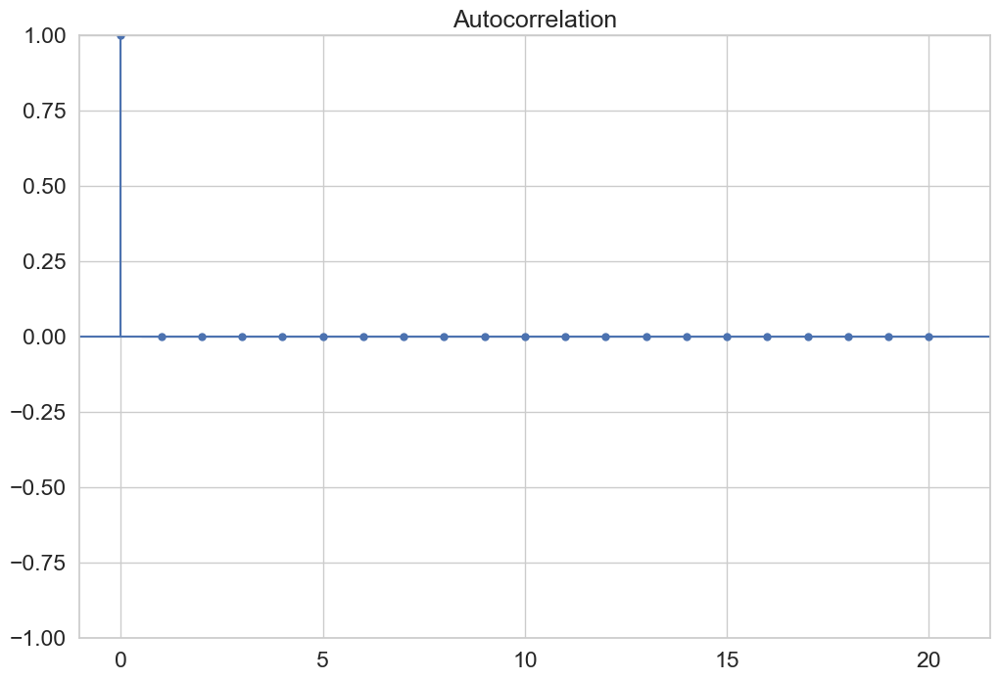

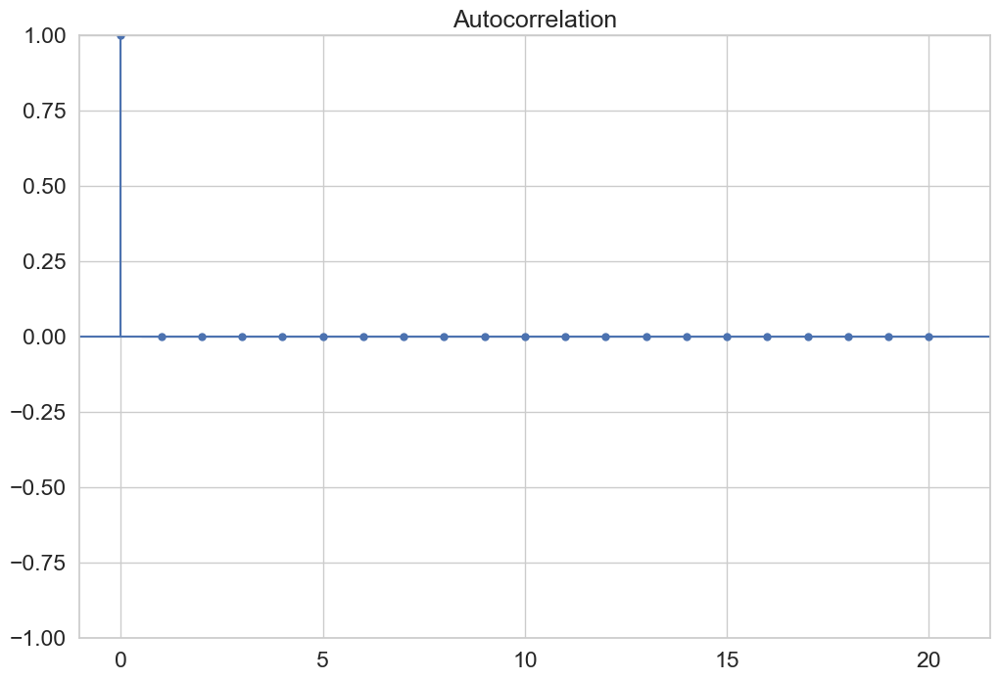

In [165]:
# Plot ACF
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(pca1.dropna(), lags=20, alpha=0.05)

In [166]:
# Compute change in daily mean 
pca2 = principalDf['pc2'].pct_change()
# Compute autocorrelation
autocorrelation = pca2.autocorr()
print('Autocorrelation is: ', autocorrelation)

Autocorrelation is:  -1.4768185282489877e-06


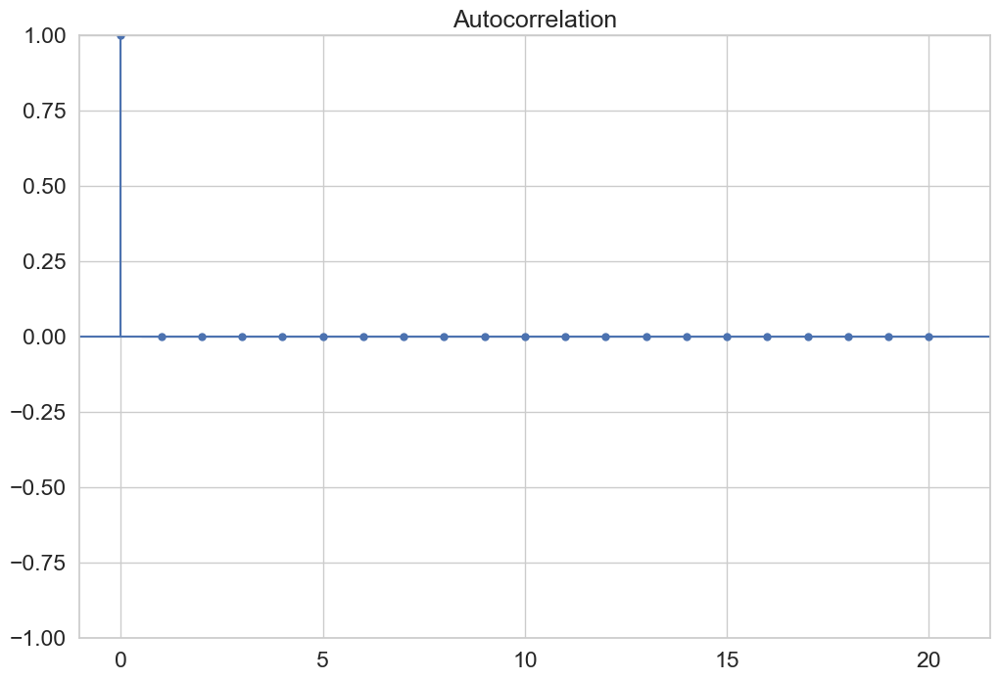

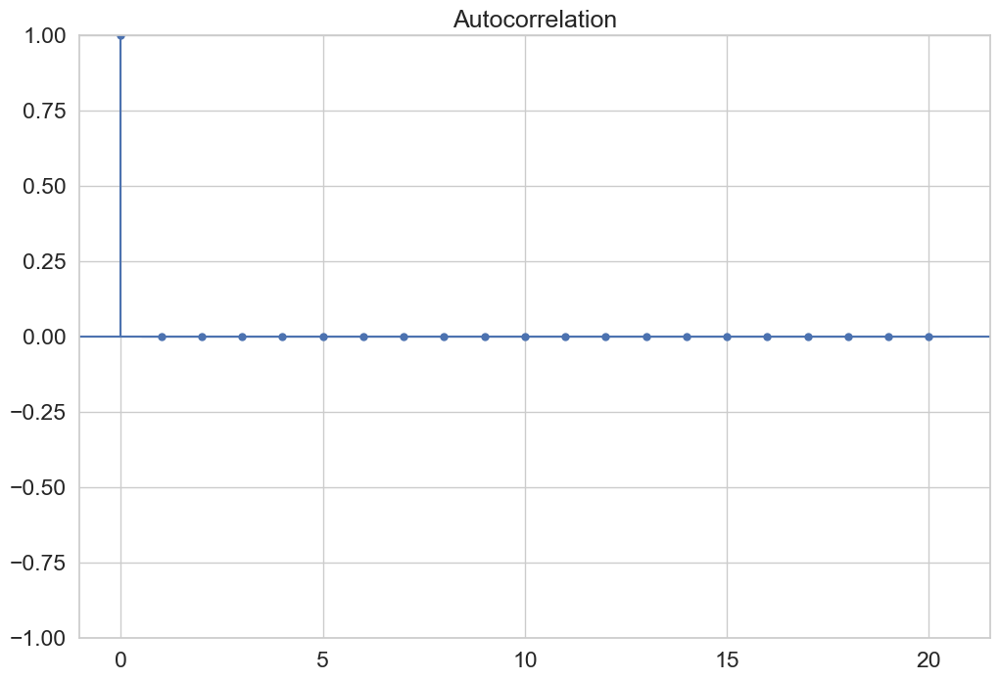

In [167]:
# Plot ACF
from statsmodels.graphics.tsaplots import plot_acf
plot_acf(pca2.dropna(), lags=20, alpha=0.05)

As seen from above, both features "pca1" and "pca2" are stationary  and not autocorrelated, I am ready for modeling using these new features(principal components).



# Step 7: Modelling

In this step, I will perform the following unsupervised learning algorithms to detect anomalies.

1) Benchmark model: Interquartile Range (IQR)
    
2) K-Means clustering

3) Isolation Forest

Let’s start training with these algorithms.



### Base Model 1: Detect Outliers Using the Interquartile Range (IQR)

Anomalies are defined as rare events that could be represented by the outliers in the data set. As an initial step, I want to apply a basic statistics technique to get the feel of the outliers present in this data set. Later, I will compare the results of the other models to the results from the Base Model for further model evaluation.

0: normal

1: anomaly

Strategy:

1)Calculate IQR which is the difference between 75th (Q3)and 25th (Q1) percentiles.

2)Calculate upper and lower bounds for the outlier.

3)Filter the data points that fall outside the upper and lower bounds and flag them as outliers.

Finally, plot the outliers on top of the time series data 


In [169]:
#Calculate IQR for the 1st principal component (pc1)
q1_pc1, q3_pc1 = sensor_df['pc1'].quantile([0.25, 0.75])
iqr_pc1 = q3_pc1 - q1_pc1
iqr_pc1

240.64393663534838

In [170]:
# Calculate upper and lower bounds for outlier for pc1
lower_pc1 = q1_pc1 - (1.5*iqr_pc1)
upper_pc1 = q3_pc1 + (1.5*iqr_pc1)
lower_pc1,upper_pc1

(-740.3139494894465, 222.2617970519471)

In [171]:
# Filter out the outliers from the pc1
sensor_df['anomaly_pc1'] = ((sensor_df['pc1']>upper_pc1) | (sensor_df['pc1']<lower_pc1)).astype('int')
sensor_df['anomaly_pc1']

timestamp
2018-04-01 00:00:00    0
2018-04-01 00:01:00    0
2018-04-01 00:02:00    0
2018-04-01 00:03:00    0
2018-04-01 00:04:00    0
                      ..
2018-08-31 23:55:00    0
2018-08-31 23:56:00    0
2018-08-31 23:57:00    0
2018-08-31 23:58:00    0
2018-08-31 23:59:00    0
Name: anomaly_pc1, Length: 220320, dtype: int64

In [172]:
# Calculate IQR for the 2nd principal component (pc2)
q1_pc2, q3_pc2 = sensor_df['pc2'].quantile([0.25, 0.75])
iqr_pc2 = q3_pc2 - q1_pc2
iqr_pc2

352.9994254220784

In [173]:
# Calculate upper and lower bounds for outlier for pc2
lower_pc2 = q1_pc2 - (1.5*iqr_pc2)
upper_pc2 = q3_pc2 + (1.5*iqr_pc2)
lower_pc2,upper_pc2

(-734.0804841790264, 677.9172175092874)

In [174]:
# Filter out the outliers from the pc2
sensor_df['anomaly_pc2'] = ((sensor_df['pc2']>upper_pc2) | (sensor_df['pc2']<lower_pc2)).astype('int')
sensor_df['anomaly_pc2']

timestamp
2018-04-01 00:00:00    0
2018-04-01 00:01:00    0
2018-04-01 00:02:00    0
2018-04-01 00:03:00    0
2018-04-01 00:04:00    0
                      ..
2018-08-31 23:55:00    0
2018-08-31 23:56:00    0
2018-08-31 23:57:00    0
2018-08-31 23:58:00    0
2018-08-31 23:59:00    0
Name: anomaly_pc2, Length: 220320, dtype: int64

In [284]:
sensor_df['anomaly_pc1'].value_counts()

0    190149
1     30171
Name: anomaly_pc1, dtype: int64

In [285]:
sensor_df['anomaly_pc2'].value_counts()

0    218696
1      1624
Name: anomaly_pc2, dtype: int64

Now I want to select the most important 20 features in the data set to detect anomalies in them. To find out these features, I will use Univariate feature selection technique.



In [176]:
# Apply SelectKBest class to extract the best 20 features - Univariate feature selection 
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.preprocessing import MinMaxScaler

x = sensor_df.drop(['machine_status', 'pc1', 'pc2', 'anomaly_pc1', 'anomaly_pc2'], axis=1)
y = sensor_df['machine_status']
scaler = MinMaxScaler()
x_scaled = scaler.fit_transform(x)
bestfeatures = SelectKBest(score_func=chi2, k=15)
fit = bestfeatures.fit(x_scaled, y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)
featureScores = pd.concat([dfcolumns, dfscores], axis=1)
featureScores.columns = ['Feature', 'Score']
print(featureScores.nlargest(15, 'Score'))

      Feature         Score
11  sensor_11  10123.423188
12  sensor_12   9893.118661
4   sensor_04   8183.512414
10  sensor_10   7770.145936
2   sensor_02   4579.464879
13  sensor_13   3460.233573
47  sensor_48   3004.248623
3   sensor_03   2680.377467
5   sensor_05   1694.808230
6   sensor_06   1379.585913
0   sensor_00   1205.839338
7   sensor_07    872.728602
9   sensor_09    699.247388
8   sensor_08    653.005739
39  sensor_40    639.106075


The above sensors have a high feature score and will be used for further analysis.

In [178]:
sensor_df.head(20)

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,...,sensor_46,sensor_47,sensor_48,sensor_49,sensor_51,machine_status,pc1,pc2,anomaly_pc1,anomaly_pc2
timestamp,,,,,,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.21180,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,50.92593,38.194440,157.9861,67.70834,201.3889,1,69.523134,265.704571,0,0
2018-04-01 00:01:00,2.465394,47.09201,53.21180,46.310760,634.3750,76.45975,13.41146,16.13136,15.56713,15.05353,...,50.92593,38.194440,157.9861,67.70834,201.3889,1,69.523134,265.704571,0,0
2018-04-01 00:02:00,2.444734,47.35243,53.21180,46.397570,638.8889,73.54598,13.32465,16.03733,15.61777,15.01013,...,51.21528,38.194443,155.9606,67.12963,203.7037,1,27.841569,283.462197,0,0
2018-04-01 00:03:00,2.460474,47.09201,53.16840,46.397568,628.1250,76.98898,13.31742,16.24711,15.69734,15.08247,...,51.21528,38.194440,155.9606,66.84028,203.1250,1,24.548981,290.213914,0,0
2018-04-01 00:04:00,2.445718,47.13541,53.21180,46.397568,636.4583,76.58897,13.35359,16.21094,15.69734,15.08247,...,51.79398,38.773150,158.2755,66.55093,201.3889,1,29.627090,294.619639,0,0
2018-04-01 00:05:00,2.453588,47.09201,53.16840,46.397568,637.6157,78.18568,13.41146,16.16753,15.89265,15.16204,...,51.79398,38.773150,164.6412,66.55093,201.6782,1,44.953421,284.267949,0,0
2018-04-01 00:06:00,2.455556,47.04861,53.16840,46.397568,633.3333,75.81614,13.43316,16.13136,15.65393,15.08247,...,51.79398,39.062500,171.8750,67.70834,200.2315,1,25.556333,289.399685,0,0
2018-04-01 00:07:00,2.449653,47.13541,53.16840,46.397568,630.6713,75.77331,13.25231,16.12413,16.19647,15.08247,...,50.92593,39.351850,178.5301,68.57639,201.0995,1,25.615016,302.203878,0,0
2018-04-01 00:08:00,2.463426,47.09201,53.16840,46.397568,631.9444,74.58916,13.28848,16.13136,15.47309,15.11863,...,50.63657,39.351850,182.0023,69.44444,201.6782,1,30.398009,295.620734,0,0


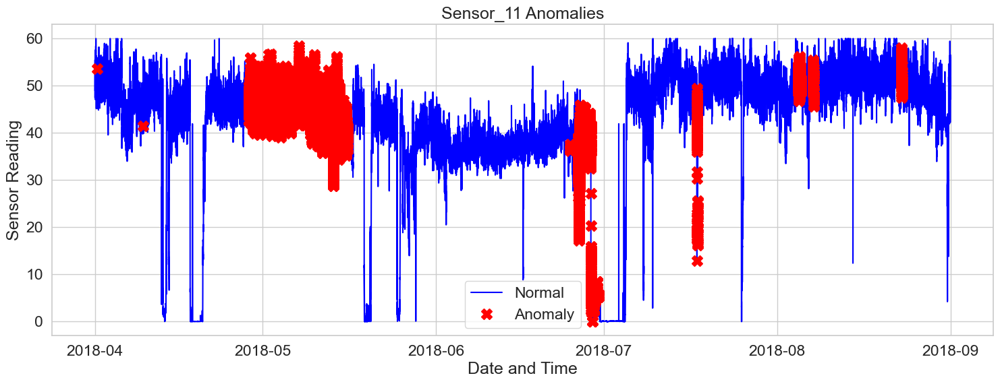

In [78]:
# Let's plot the outliers from pc1 on top of the sensor_11 see where they occured in the time series
a = sensor_df[sensor_df['anomaly_pc1'] == 1] #anomaly
_ = plt.figure(figsize=(18,6))
_ = plt.plot(sensor_df['sensor_11'], color='blue', label='Normal')
_ = plt.plot(a['sensor_11'], linestyle='none', marker='X', color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Sensor_11 Anomalies')
_ = plt.legend(loc='best')
plt.show();


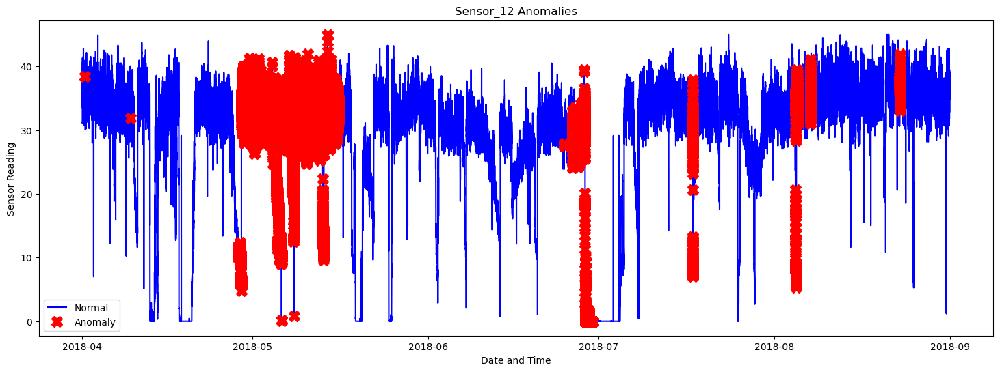

In [276]:
# Let's plot the outliers from pc1 on top of the sensor_12 see where they occured in the time series
a = sensor_df[sensor_df['anomaly_pc1'] == 1] #anomaly
_ = plt.figure(figsize=(18,6))
_ = plt.plot(sensor_df['sensor_12'], color='blue', label='Normal')
_ = plt.plot(a['sensor_12'], linestyle='none', marker='X', color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Sensor_12 Anomalies')
_ = plt.legend(loc='best')
plt.show();

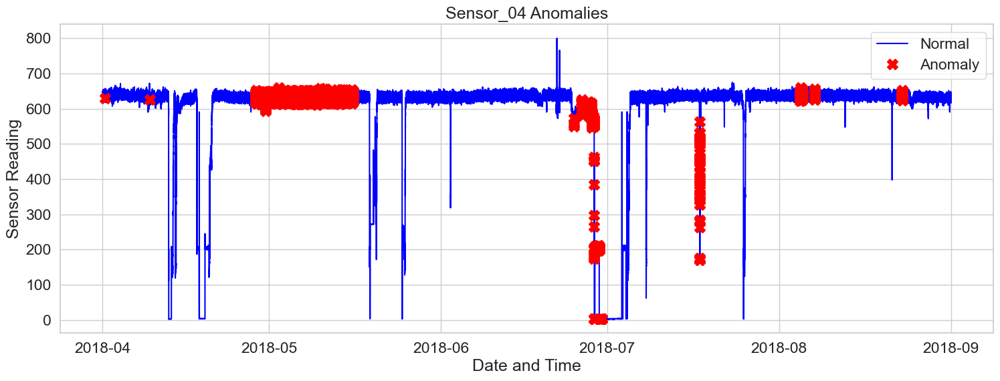

In [77]:
# Let's plot the outliers from pc1 on top of the sensor_04 see where they occured in the time series
a = sensor_df[sensor_df['anomaly_pc1'] == 1] #anomaly
_ = plt.figure(figsize=(18,6))
_ = plt.plot(sensor_df['sensor_04'], color='blue', label='Normal')
_ = plt.plot(a['sensor_04'], linestyle='none', marker='X', color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Sensor_04 Anomalies')
_ = plt.legend(loc='best')
plt.show();

In [277]:
#Now lets check for pc2 

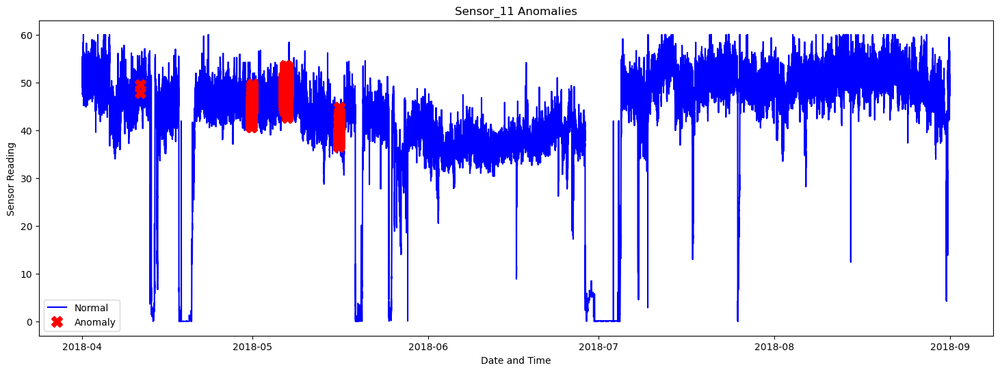

In [278]:


# Let's plot the outliers from pc2 on top of the sensor_11 see where they occured in the time series
a = sensor_df[sensor_df['anomaly_pc2'] == 1] #anomaly
_ = plt.figure(figsize=(18,6))
_ = plt.plot(sensor_df['sensor_11'], color='blue', label='Normal')
_ = plt.plot(a['sensor_11'], linestyle='none', marker='X', color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Sensor_11 Anomalies')
_ = plt.legend(loc='best')
plt.show();


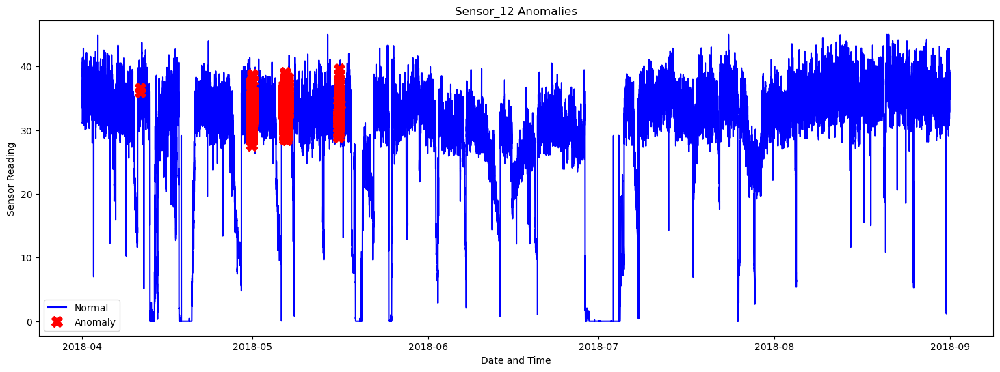

In [279]:
# Let's plot the outliers from pc2 on top of the sensor_12 see where they occured in the time series
a = sensor_df[sensor_df['anomaly_pc2'] == 1] #anomaly
_ = plt.figure(figsize=(18,6))
_ = plt.plot(sensor_df['sensor_12'], color='blue', label='Normal')
_ = plt.plot(a['sensor_12'], linestyle='none', marker='X', color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Sensor_12 Anomalies')
_ = plt.legend(loc='best')
plt.show();

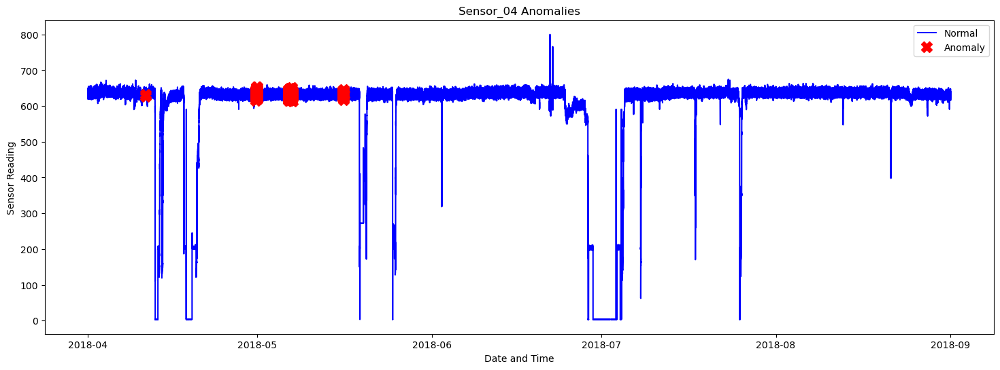

In [280]:
# Let's plot the outliers from pc2 on top of the sensor_04 see where they occured in the time series
a = sensor_df[sensor_df['anomaly_pc2'] == 1] #anomaly
_ = plt.figure(figsize=(18,6))
_ = plt.plot(sensor_df['sensor_04'], color='blue', label='Normal')
_ = plt.plot(a['sensor_04'], linestyle='none', marker='X', color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Sensor_04 Anomalies')
_ = plt.legend(loc='best')
plt.show();

As seen above, the anomalies are detected right before the machine breaks down. This could be a very valuable information for an operator to see and be able to shut down the machine properly before it actually goes down hard. Let’s see if we detect similar pattern in anomalies from the next algorithms.

As seen from above, there are a lot more outliers in pc1 (1st principal component) than that from pc2.  Also the outliers in pc1 seem to better explain the failures in the sensor readings from one of the sensors.

### Model 2: K-Means Clustering


Strategy:

The underline assumption in the clustering based anomaly detection is that if we cluster the data, normal data will belong to clusters while anomalies will not belong to any clusters or belong to small clusters. We use the following steps to find and visualize anomalies.

Calculate the distance between each point and its nearest centroid. The biggest distances are considered as anomaly.

We use outliers_fraction to provide information to the algorithm about the proportion of the outliers present in our data set. 

Situations may vary from data set to data set. However, as a starting figure, I estimate outliers_fraction=0.13 (13% of df are outliers as depicted).

Calculate number_of_outliers using outliers_fraction.

Set threshold as the minimum distance of these outliers.

The anomaly result of anomaly1 contains the above method Cluster (0:normal, 1:anomaly).

Visualize anomalies with Time Series view.

In [50]:
#pip install --upgrade scikit-learn

In [51]:
#pip install threadpoolctl==3.1.0

In [52]:
# Import necessary libraries
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

<AxesSubplot:xlabel='pc1', ylabel='pc2'>

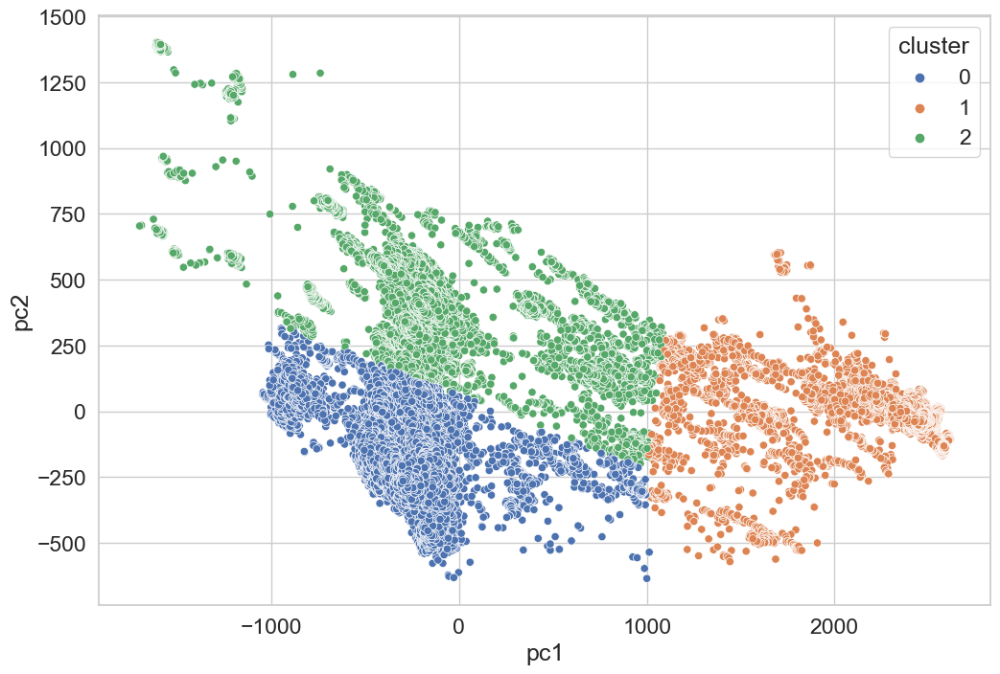

In [58]:
# I will start k-means clustering with k=2 as I already know that there are 3 classes .
kmeans =KMeans(n_clusters=2).fit(principalDf.values)
principalDf['cluster'] = pd.Categorical(kmeans.labels_)
sns.scatterplot(x="pc1",y="pc2",hue="cluster",data=principalDf)

In [59]:
# Write a function that calculates distance between each point and the centroid of the closest cluster
def getDistanceByPoint(data, model):
    """ Function that calculates the distance between a point and centroid of a cluster, 
            returns the distances in pandas series"""
    distance = []
    for i in range(0,len(data)):
        Xa = np.array(data.loc[i])
        Xb = model.cluster_centers_[model.labels_[i]-1]
        distance.append(np.linalg.norm(Xa-Xb))
    return pd.Series(distance, index=data.index)

In [60]:
# Assume that 13% of the entire data set are anomalies 
outliers_fraction = 0.13

In [61]:
# get the distance between each point and its nearest centroid. The biggest distances are considered as anomaly
distance = getDistanceByPoint(principalDf, kmeans)

In [62]:
# number of observations that equate to the 13% of the entire data set
number_of_outliers = int(outliers_fraction*len(distance))

In [63]:
# Take the minimum of the largest 13% of the distances as the threshold
threshold = distance.nlargest(number_of_outliers).min()

In [65]:
# anomaly1 contain the anomaly result of the above method Cluster (0:normal, 1:anomaly) 
principalDf['anomaly1'] = (distance >= threshold).astype(int)
principalDf['anomaly1']

0         0
1         0
2         0
3         0
4         0
         ..
220315    0
220316    0
220317    0
220318    0
220319    0
Name: anomaly1, Length: 220320, dtype: int64

In [79]:
principalDf.head()

,pc1,pc2,cluster,anomaly1,anomaly2
0,69.523134,265.704571,2,0,1
1,69.523134,265.704571,2,0,1
2,27.841569,283.462197,2,0,1
3,24.548981,290.213914,2,0,1
4,29.627090,294.619639,2,0,1


In [80]:
principalDf['anomaly1'].value_counts()

0    191679
1     28641
Name: anomaly1, dtype: int64

In [88]:
sensor_df['anomaly1'] = pd.Series(principalDf['anomaly1'].values, index=sensor_df.index)

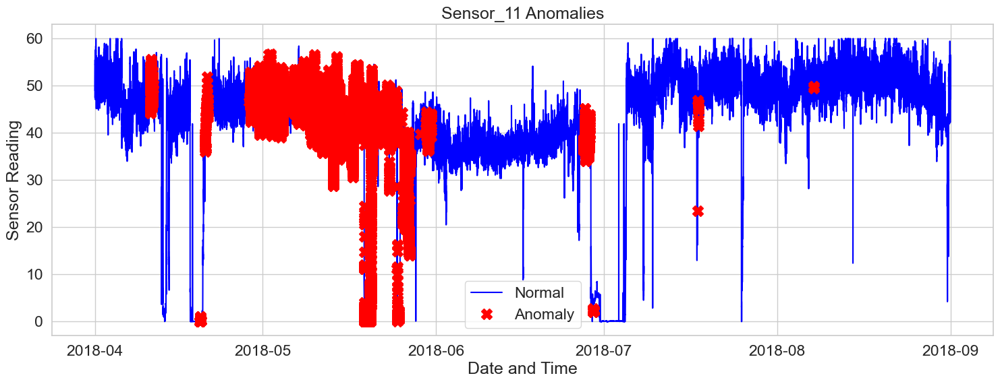

In [89]:
# Let's plot the annomaly1 on top of the sensor_11 see where they occured in the time series
a = sensor_df[sensor_df['anomaly1'] == 1] #anomaly
_ = plt.figure(figsize=(18,6))
_ = plt.plot(sensor_df['sensor_11'], color='blue', label='Normal')
_ = plt.plot(a['sensor_11'], linestyle='none', marker='X', color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Sensor_11 Anomalies')
_ = plt.legend(loc='best')
plt.show();

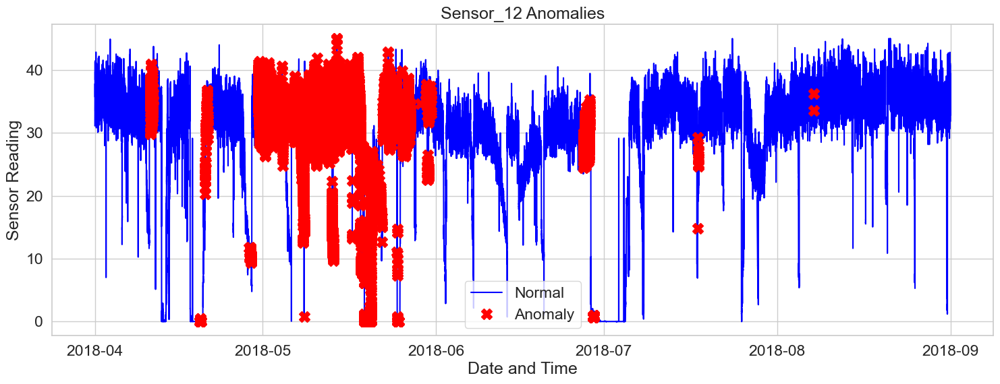

In [90]:
# Let's plot the outliers from pc1 on top of the sensor_12 see where they occured in the time series

a = sensor_df[sensor_df['anomaly1'] == 1] #anomaly
_ = plt.figure(figsize=(18,6))
_ = plt.plot(sensor_df['sensor_12'], color='blue', label='Normal')
_ = plt.plot(a['sensor_12'], linestyle='none', marker='X', color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Sensor_12 Anomalies')
_ = plt.legend(loc='best')
plt.show();

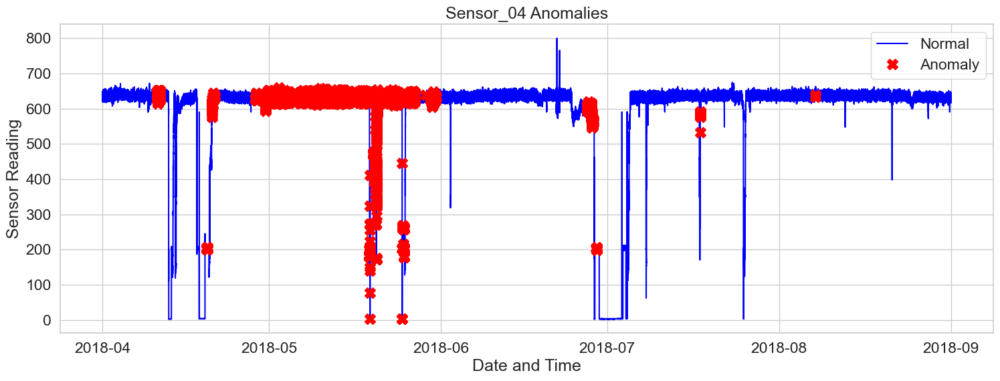

In [91]:
# Let's plot anomaly1 on top of the sensor_04 see where they occured in the time series
a = sensor_df[sensor_df['anomaly1'] == 1] #anomaly
_ = plt.figure(figsize=(18,6))
_ = plt.plot(sensor_df['sensor_04'], color='blue', label='Normal')
_ = plt.plot(a['sensor_04'], linestyle='none', marker='X', color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Sensor_04 Anomalies')
_ = plt.legend(loc='best')
plt.show();


In [92]:
sensor_df[sensor_df['anomaly1']==1]['machine_status'].value_counts()

1    27310
2     1330
0        1
Name: machine_status, dtype: int64

In [93]:
sensor_df['machine_status'].value_counts()

1    205836
2     14477
0         7
Name: machine_status, dtype: int64

### Model 3: Isolation Forest


In [94]:
# Import IsolationForest
from sklearn.ensemble import IsolationForest

In [95]:
# Assume that 13% of the entire data set are anomalies
 
outliers_fraction = 0.13
model =  IsolationForest(contamination=outliers_fraction)
model.fit(principalDf.values) 
principalDf['anomaly2'] = pd.Series(model.predict(principalDf.values))

In [99]:
# visualization
sensor_df['anomaly2'] = pd.Series(principalDf['anomaly2'].values, index=sensor_df.index)


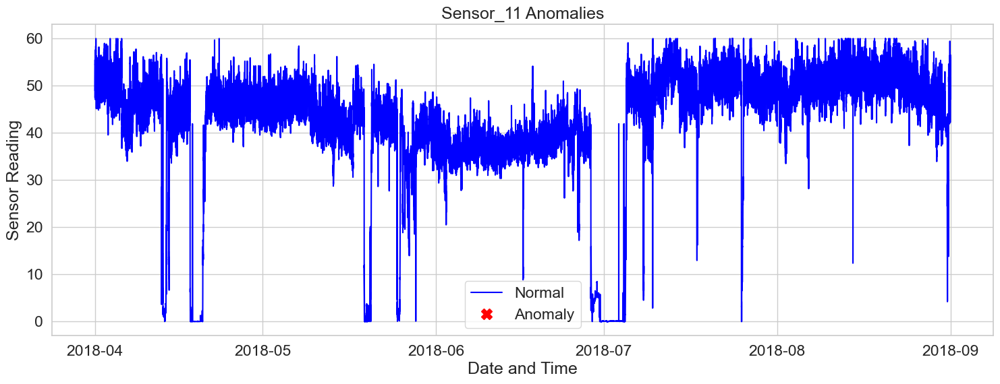

In [115]:
a = sensor_df.loc[sensor_df['anomaly2'] == 1] #anomaly
_ = plt.figure(figsize=(18,6))
_ = plt.plot(sensor_df['sensor_11'], color='blue', label='Normal')
_ = plt.plot(a['sensor_11'], linestyle='none', marker='X', color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Sensor_11 Anomalies')
_ = plt.legend(loc='best')
plt.show();


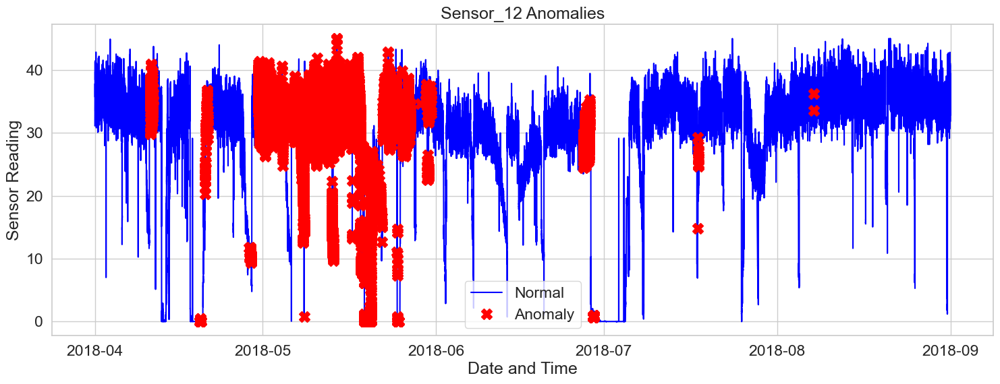

In [102]:
# visualization
a = sensor_df[sensor_df['anomaly1'] == 1] 
_ = plt.figure(figsize=(18,6))
_ = plt.plot(sensor_df['sensor_12'], color='blue', label='Normal')
_ = plt.plot(a['sensor_12'], linestyle='none', marker='X', color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Sensor_12 Anomalies')
_ = plt.legend(loc='best')
plt.show();

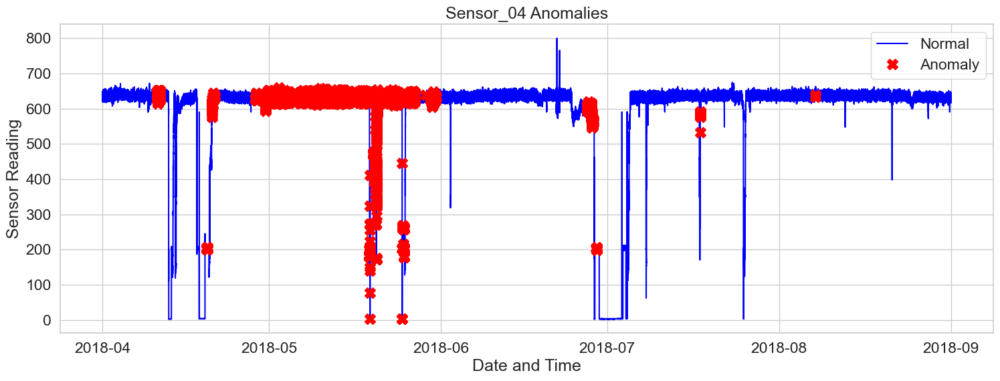

In [105]:
# visualization
a = sensor_df[sensor_df['anomaly1'] == 1] 
_ = plt.figure(figsize=(18,6))
_ = plt.plot(sensor_df['sensor_04'], color='blue', label='Normal')
_ = plt.plot(a['sensor_04'], linestyle='none', marker='X', color='red', markersize=12, label='Anomaly')
_ = plt.xlabel('Date and Time')
_ = plt.ylabel('Sensor Reading')
_ = plt.title('Sensor_04 Anomalies')
_ = plt.legend(loc='best')
plt.show();

In [114]:
sensor_df[sensor_df['anomaly1']==1]['machine_status'].value_counts()

1    27310
2     1330
0        1
Name: machine_status, dtype: int64

In [107]:
sensor_df['anomaly2'].value_counts()

Series([], Name: anomaly2, dtype: int64)

In [109]:
sensor_df[sensor_df['anomaly2']==1]['machine_status'].value_counts()

Series([], Name: machine_status, dtype: int64)

In [111]:
sensor_df['machine_status'].value_counts()

1    205836
2     14477
0         7
Name: machine_status, dtype: int64

# Model Evaluation

It is interesting to see that all three models detected a lot of the similar anomalies. 
From the above analysis, we see that IQR is detecting far more anomalies than that of K-Means and Isolation Forest.



# Conclusion

So far, we have done anomaly detection with three different methods. In doing so, we went through most of the steps of the commonly applied Data Science Process which includes the following steps:

1)Problem identification

2)Data wrangling

3)Exploratory data analysis

4)Pre-processing and training data development

5)Modeling

6)Documentation

One of the challenges I faced during this project is that training anomaly detection models with unsupervised learning algorithms with such a large data set can be computationally very expensive. For example, I couldn’t properly train SVM on this data as it was taking a very long time to train the model with no success.

I suggest the following next steps :
    
    
1)Feature selection with  Feature engineering technique like Chi Square

2)Use features with high Importance and create a new dataframe

3)Implement other classification algorithms such as SVM, Random Forest, XGBBoost.

4)Predict the machine status with the best model given a test set 




# Other Classification Models

Creating a new data Frame with features that have high importance from Chi Square Test

In [281]:
selected_columns=['sensor_00','sensor_01','sensor_02','sensor_03','sensor_04','sensor_05','sensor_06','sensor_07','sensor_08','sensor_09','sensor_46','sensor_47','sensor_48','sensor_49','sensor_51','machine_status']
df2 = sensor_df[selected_columns]
df2

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,sensor_46,sensor_47,sensor_48,sensor_49,sensor_51,machine_status
timestamp,,,,,,,,,,,,,,,,
2018-04-01 00:00:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,15.05353,50.92593,38.194440,157.9861,67.70834,201.3889,1
2018-04-01 00:01:00,2.465394,47.09201,53.211800,46.310760,634.375000,76.45975,13.41146,16.13136,15.56713,15.05353,50.92593,38.194440,157.9861,67.70834,201.3889,1
2018-04-01 00:02:00,2.444734,47.35243,53.211800,46.397570,638.888900,73.54598,13.32465,16.03733,15.61777,15.01013,51.21528,38.194443,155.9606,67.12963,203.7037,1
2018-04-01 00:03:00,2.460474,47.09201,53.168400,46.397568,628.125000,76.98898,13.31742,16.24711,15.69734,15.08247,51.21528,38.194440,155.9606,66.84028,203.1250,1
2018-04-01 00:04:00,2.445718,47.13541,53.211800,46.397568,636.458300,76.58897,13.35359,16.21094,15.69734,15.08247,51.79398,38.773150,158.2755,66.55093,201.3889,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018-08-31 23:55:00,2.407350,47.69965,50.520830,43.142361,634.722229,64.59095,15.11863,16.65220,15.65393,15.16204,48.32176,41.087960,212.3843,153.64580,231.1921,1
2018-08-31 23:56:00,2.400463,47.69965,50.564240,43.142361,630.902771,65.83363,15.15480,16.70284,15.65393,15.11863,48.03241,40.798610,213.8310,156.25000,231.1921,1
2018-08-31 23:57:00,2.396528,47.69965,50.520830,43.142361,625.925903,67.29445,15.08970,16.70284,15.69734,15.11863,48.03241,40.798610,217.3032,155.38190,232.0602,1


#### Train Test Split

In [188]:
# Let's extract the selected features (sensors) from data. Divide the data into training and Test data.

X = df2.drop(columns=['machine_status'])
y = df2['machine_status']

In [189]:
# 75% of dataset is used for training and the remaining 25% is used for testing.

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.25,random_state=101)

#### Scaling the data

#Data is scaled using Min-Max Scaler ,so all the data is transformed within the given range without changing the shape of the original distribution.

In [286]:

from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

scaler.fit(X_train)


MinMaxScaler()

In [191]:
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [193]:
X_train

array([[0.96256281, 0.8156683 , 0.77798846, ..., 0.16648649, 0.07072043,
        0.19047623],
       [0.00154381, 0.83026119, 0.63757084, ..., 0.01621621, 0.01850628,
        0.01279762],
       [0.94442326, 0.8156683 , 0.70398461, ..., 0.07999999, 0.05287508,
        0.19226193],
       ...,
       [0.93014285, 0.85023052, 0.73624278, ..., 0.52324317, 0.15135492,
        0.23511911],
       [0.96758004, 0.8540707 , 0.6925997 , ..., 0.33783775, 0.08790481,
        0.16488095],
       [0.96101908, 0.80721973, 0.77039837, ..., 0.48648646, 0.09451423,
        0.2142857 ]])

In [194]:
X_test

array([[0.97105393, 0.79877116, 0.81593887, ..., 0.26432435, 0.06146729,
        0.18154761],
       [0.98494792, 0.89247309, 0.77229578, ..., 0.12324323, 0.06212822,
        0.16488095],
       [0.93064179, 0.67972361, 0.24288394, ..., 0.00972973, 0.00660939,
        0.00416666],
       ...,
       [0.9648786 , 0.86712759, 0.85578713, ..., 0.38648646, 0.06477198,
        0.18333331],
       [0.94712469, 0.88786491, 0.79696388, ..., 0.33783775, 0.08790481,
        0.18988099],
       [0.95677352, 0.8172043 , 0.78937336, ..., 0.09351351, 0.03569068,
        0.14999999]])

The above shows the scaled data. It is now ready for Modelling.

#### Modelling:

I have used the following Classification models for predicting Machine Failure.

1. Random Forest Classifier
2. KNN( K Nearest Neighbour)
3. Support Vector Machines(SVM)
4. XGBoost

In [195]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score

#### Random Forest

In [263]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier(n_estimators=100, criterion='gini',random_state=23,max_depth=6,bootstrap=True)
rfc.fit(X_train,y_train)

RandomForestClassifier(max_depth=6, random_state=23)

In [264]:
predictions = rfc.predict(X_test)


In [265]:
rfc.feature_importances_

array([0.03054672, 0.12562862, 0.0715204 , 0.04934806, 0.20599328,
       0.08361915, 0.02112161, 0.00758089, 0.01293088, 0.00404673,
       0.04781037, 0.02246334, 0.20699165, 0.0936242 , 0.01677409])

In [266]:
import numpy as np
 
importances = rfc.feature_importances_
#
# Sort the feature importance in descending order
#
sorted_indices = np.argsort(importances)[::-1]
 
feat_labels = df2.columns[1:]
 
for f in range(X_train.shape[1]):
    print("%2d) %-*s %f" % (f + 1, 30,
                            feat_labels[sorted_indices[f]],
                            importances[sorted_indices[f]]))

 1) sensor_49                      0.206992
 2) sensor_05                      0.205993
 3) sensor_02                      0.125629
 4) sensor_51                      0.093624
 5) sensor_06                      0.083619
 6) sensor_03                      0.071520
 7) sensor_04                      0.049348
 8) sensor_47                      0.047810
 9) sensor_01                      0.030547
10) sensor_48                      0.022463
11) sensor_07                      0.021122
12) machine_status                 0.016774
13) sensor_09                      0.012931
14) sensor_08                      0.007581
15) sensor_46                      0.004047


AttributeError: 'numpy.ndarray' object has no attribute 'columns'

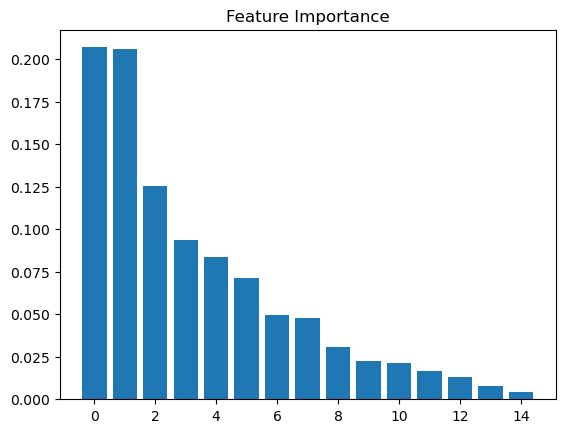

In [267]:
import matplotlib.pyplot as plt

plt.title('Feature Importance')
plt.bar(range(X_train.shape[1]), importances[sorted_indices], align='center')
plt.xticks(range(X_train.shape[1]),X_train.columns[sorted_indices], rotation=90)
plt.tight_layout()
plt.show()

In [268]:
from sklearn.metrics import classification_report,confusion_matrix

print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         4
           1       1.00      1.00      1.00     51477
           2       1.00      0.99      0.99      3599

    accuracy                           1.00     55080
   macro avg       0.67      0.66      0.66     55080
weighted avg       1.00      1.00      1.00     55080



In [269]:
print(confusion_matrix(y_test,predictions))

[[    0     3     1]
 [    0 51476     1]
 [    0    34  3565]]


Confusion matrix 


A confusion matrix is a tool for summarizing the performance of a classification algorithm. A confusion matrix will give us a clear picture of classification model performance and the types of errors produced by the model. It gives us a summary of correct and incorrect predictions broken down by each category. The summary is represented in a tabular form.

Four types of outcomes are possible while evaluating a classification model performance. These four outcomes are described below:-

True Positives (TP) – True Positives occur when we predict an observation belongs to a certain class and the observation actually belongs to that class.

True Negatives (TN) – True Negatives occur when we predict an observation does not belong to a certain class and the observation actually does not belong to that class.

False Positives (FP) – False Positives occur when we predict an observation belongs to a certain class but the observation actually does not belong to that class. This type of error is called Type I error.

False Negatives (FN) – False Negatives occur when we predict an observation does not belong to a certain class but the observation actually belongs to that class. This is a very serious error and it is called Type II error.

These four outcomes are summarized in a confusion matrix given below.

Evaluating Models: Accuracy Is Not Enough
As mentioned in the previous section, in anomaly detection applications it is expected that the distribution between the normal and abnormal class(es) may be highly skewed. This is commonly referred to as the class imbalance problem. A model that learns from such skewed data may not be robust; it may be accurate when classifying examples within the normal class, but perform poorly when classifying anomalous examples.

For example, consider a dataset consisting of 1,000 images of luggage passing through a security checkpoint. 950 images are of normal pieces of luggage, and 50 are abnormal. A classification model that always classifies an image as normal can achieve high overall accuracy for this dataset (95%), even though its accuracy rate for classifying abnormal data is 0%.

Such a model may also misclassify normal examples as anomalous (false positives, FP), or misclassify anomalous examples as normal ones (false negatives, FN). As we consider both of these types of errors, it becomes obvious that the traditional accuracy metric (total number of correct classifications divided by total classifications) is insufficient in evaluating the skill of an anomaly detection model.

Two important metrics have been introduced that provide a better measure of model skill: precision and recall. Precision is defined as the number of true positives (TP) divided by the number of true positives plus the number of false positives (FP), while recall is the number of true positives divided by the number of true positives plus the number of false negatives (FN). Depending on the use case or application, it may be desirable to optimize for either precision or recall.

Optimizing for precision may be useful when the cost of failure is low, or to reduce human workload. Optimizing for high recall may be more appropriate when the cost of a false negative is very high; for example, in airport security, where it is better to flag many items for human inspection (low cost) in order to avoid the much higher cost of incorrectly admitting a dangerous item onto a flight. While there are several ways to optimize for precision or recall, the manner in which a threshold is set can be used to reflect the precision and recall preferences for each specific use case.

You now have an idea of why an unsupervised or semi-supervised approach to anomaly detection is desirable, and what metrics are best to use for evaluating these models. In the next section, we focus on semi-supervised approaches and discuss how they work.

#### KNN( K Nearest Neighbour)

In [233]:
from sklearn.neighbors import KNeighborsClassifier

In [237]:
knn = KNeighborsClassifier(n_neighbors=3)

In [238]:
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=3)

In [239]:
pred = knn.predict(X_test)

In [240]:
from sklearn.metrics import classification_report,confusion_matrix

In [241]:
print(confusion_matrix(y_test,pred))

[[    0     3     1]
 [    0 51475     2]
 [    0     7  3592]]


In [242]:
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         4
           1       1.00      1.00      1.00     51477
           2       1.00      1.00      1.00      3599

    accuracy                           1.00     55080
   macro avg       0.67      0.67      0.67     55080
weighted avg       1.00      1.00      1.00     55080



In [244]:
print("Accuracy score:",metrics.accuracy_score(y_test, pred))
print("Precision score:",metrics.precision_score(y_test, pred,average='macro'))
print("Recall score:",metrics.recall_score(y_test, pred,average='macro'))
print("F1 Score :",metrics.f1_score(y_test, pred,average='macro'))

Accuracy score: 0.9997639796659404
Precision score: 0.6663237587733333
Recall score: 0.6660053876596842
F1 Score : 0.6661644682952624


#### SVM ( Support Vector Machines)

In [246]:
from sklearn.svm import SVC

model = SVC(kernel='rbf')

In [247]:
model.fit(X_train,y_train)

SVC()

In [248]:
predictions = model.predict(X_test)

In [249]:
from sklearn.metrics import classification_report,confusion_matrix

In [250]:
print(confusion_matrix(y_test,predictions))

[[    0     2     2]
 [    0 51451    26]
 [    0    34  3565]]


In [251]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         4
           1       1.00      1.00      1.00     51477
           2       0.99      0.99      0.99      3599

    accuracy                           1.00     55080
   macro avg       0.66      0.66      0.66     55080
weighted avg       1.00      1.00      1.00     55080



In [252]:
print("Accuracy score:",metrics.accuracy_score(y_test, predictions))
print("Precision score:",metrics.precision_score(y_test, predictions,average='macro'))
print("Recall score:",metrics.recall_score(y_test, predictions,average='macro'))
print("F1 Score :",metrics.f1_score(y_test, predictions,average='macro'))

Accuracy score: 0.9988380537400146
Precision score: 0.6638359545588995
Recall score: 0.6633492838104038
F1 Score : 0.6635923860454296


#### XGBoost

In [253]:
#!pip install xgboost

In [254]:
import xgboost as xgb
from xgboost import XGBClassifier

In [255]:
# convet the target column 
df2['machine_status'].replace([2,1,0],['Recovering','Broken','Normal'],inplace=True)

In [256]:
 
model = XGBClassifier()
model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [257]:
y_pred = model.predict(X_test)

In [258]:
from sklearn.metrics import classification_report,confusion_matrix

In [259]:
print(confusion_matrix(y_test,predictions))

[[    0     2     2]
 [    0 51451    26]
 [    0    34  3565]]


In [260]:
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00         4
           1       1.00      1.00      1.00     51477
           2       0.99      0.99      0.99      3599

    accuracy                           1.00     55080
   macro avg       0.66      0.66      0.66     55080
weighted avg       1.00      1.00      1.00     55080



In [261]:
print("Accuracy score:",metrics.accuracy_score(y_test, predictions))
print("Precision score:",metrics.precision_score(y_test, predictions,average='macro'))
print("Recall score:",metrics.recall_score(y_test, predictions,average='macro'))
print("F1 Score :",metrics.f1_score(y_test, predictions,average='macro'))

Accuracy score: 0.9988380537400146
Precision score: 0.6638359545588995
Recall score: 0.6633492838104038
F1 Score : 0.6635923860454296


Since the dataset is highly imbalanced. Accuracy is not a true measure of model Performance.Hence, Precision, Recall and F1 score are used to evaluate the model performance.

# LSTM

In [262]:
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dropout
from keras.layers import Dense
from sklearn.metrics import mean_squared_error,r2_score
import matplotlib.pyplot as plt
import numpy as np

model = Sequential()
model.add(LSTM(100, input_shape=(train_x.shape[1], train_x.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')

# Network fitting
history = model.fit(train_x, train_y, epochs=150, batch_size=70, validation_data=(test_x, test_y), verbose=2, shuffle=False)

# Loss history plot
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

size = df.shape[1]

# Prediction test
yhat = model.predict(test_x)
test_x = test_x.reshape((test_x.shape[0], size))

# invert scaling for prediction
inv_yhat = np.concatenate((yhat, test_x[:, 1-size:]), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,0]

# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = np.concatenate((test_y, test_x[:, 1-size:]), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,0]

# calculate RMSE
rmse = np.sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)

2024-03-02 16:23:07.803388: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


NameError: name 'train_x' is not defined

In [274]:
model = Sequential()
model.add(LSTM(100, input_shape=(X_train.shape[1], X_train.shape[10])))
model.add(Dropout(0.2))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='adam')


IndexError: tuple index out of range

# Conclusion and Future Suggestions 

Let's review what we did in this project. First we explored the data given to us and visualized it. It is suggested not to view all the data before splitting into testing and training sets but for learning experience and this project specifically, we decided to look at it all first. Then we visualized the data to get a better since of the patterns. Next, we did data preprocessing by dealing with missing data with forward-fill propogation. We used PCA to find the most useful features (columns) to use when trainging the models. We then trained many KMeans and KNN models and found the best one for each. Finally, we compared the models performance. Overall we used three models: two unsupervised models including PCA and KMeans Clusters and one supervised model using KNN.

We saw in both the KMeans and the KNN models that the test accuracy, precision, and recall seemed quite good. However, by understanding our data and investigating further, we know that is probably not the case. Our data was very unbalanced; almost all the data was labeled NORMAL, then we had some RECOVERING, and very few BROKEN instances. What this means for our models is that it had a hard time identifying anything other than NORMAL. This is important in real-life situations to be aware of. By just looking at the performance test results, we might have thought we got a fantastic model. But the truth is that we were not able to find a single BROKEN instance either the KNN nor the KMeans models.

Every project should recommend ways to enhance their work. For this project, we would recommend using more data with more variety. As said, this data was very unbalanced. Ways to do this would be to find more data, create more data, or even artificially create more data. Another recommendation would be to use different models other than KNN and KMeans. Models which are more geared towards anomaly detection (such as a forest or SVM) or predictive maintanence algorthims (such as a regression model to find remaining useful life by using similiarity measures) could have done a better job than our presented models. Lastly, having more water pumps to compare to this pump may have helped the algorithms learn better.

